### **Fundamentos-analitica-II**
FACULTAD DE INGENIERÍA, DISEÑO Y CIENCIAS APLICADAS
 
MAESTRÍA EN CIENCIA DE DATOS

TIC 60153 – Fundamentos de analítica II

*PROYECTO DE PRONOSTICO DE PSA PARA PACIENTES ENTRE 48 Y 60 AÑOS*

GRUPO:
- Esteban Ordoñez
- Raul Echeverry
- Fabian Salazar Figueroa
    

__________________________

### **Descripción**

Contexto de negocio.

El cáncer de próstata es uno de los tipos de cáncer más comunes en hombres. La detección temprana es crucial para mejorar las tasas de supervivencia. La prueba de antígeno prostático específico (PSA) puede ayudar a detectar el cáncer de próstata en etapas tempranas, cuando es más tratable. Sin embargo, el PSA no es específico para el cáncer de próstata y puede estar elevado en otras condiciones como prostatitis o hiperplasia prostática benigna (HPB).

El antígeno prostático específico (PSA) es una proteína producida por células normales y malignas de la glándula prostática. La prueba del PSA mide el nivel de esta proteína en la sangre y es uno de los métodos más utilizados para el tamizaje del cáncer de próstata.

La EPS SaludPorTi, está interesado en priorizar la toma de está prueba, aumentando la demanda y detención temprana del Cáncer de Próstata.

Problema de negocio
La empresa ha decidido contratarlos para que construyan un modelo predictivo que permita estimar la probabilidad de que un usuario entre 48 y 60 años de edad presente resultados anormales de PSA.


Contexto analítico

Se espera que entrene diferentes familias de modelos predictivos de clasificación (SVC con diferentes kernels, Redes Neuronales poco profundas), precedidos por diferentes procesos de transformación (normalizaciones, imputación, feature engineering, dummificación, PCA, selección de features).


La evaluación de la calidad de los flujos de modelos predictivos se debe estimar utilizando la métrica de ROC_AUC.

Expliquen sus ideas, el por qué realizan las acciones, y comenten los resultados obtenidos; se espera mucho más que unos bloques de código.
La toma de decisiones sobre los datos se debe hacer considerando el contexto del problema y de los datos, no se puede ver todo solamente desde los ojos de los datos, sino también considerar el negocio.
Un Científico de Datos debe poder comunicar los puntos importantes de su trabajo en un lenguaje universal para todos los públicos.
Todo esto se considerará en la nota.

### **Cita**

@misc{fa-ii-2024-ii-flujos-de-modelos-tradicionales,
    author = {Daniel Osorio, JavierDiaz},
    title = {FA II 2024-II: flujos de modelos tradicionales},
    publisher = {Kaggle},
    year = {2024},
    url = {https://kaggle.com/competitions/fa-ii-2024-ii-flujos-de-modelos-tradicionales}
}

_________________________________________________________________________________________________________________________________________________________________________________________

### **Flujo de trabajo completo y detallado**
**1.	Definición del problema y objetivos del negocio**
- Definir el objetivo clave: predecir si un paciente entre 48 y 60 años tendrá un resultado anormal de PSA, ayudando a priorizar las pruebas para una detección temprana del cáncer de próstata.

**2.	Análisis exploratorio de datos (EDA)**
- Revisar la distribución de las variables.
- Verificar la correlación entre las características.
- Detectar valores faltantes, outliers, y estudiar las relaciones de las características con la variable objetivo.
- Explorar diferencias entre las clases objetivo (PSA normal vs anormal).

**3.	Preprocesamiento de datos**
- Analisis de importancia de variables
- Formateo de variables.
- Manejo de outliers.
- Imputar valores faltantes.
- Escalar las variables numéricas (normalización o estandarización).
- Codificar las variables categóricas mediante dummificación (One-Hot Encoding).
- Considerar técnicas como reducción de dimensionalidad (PCA) si es necesario.
- Crear un pipeline de preprocesamiento para que los datos estén listos para usarse en los modelos.

Abordaremos esto de una forma donde haremos un preprocesamiento previo a algunas variables que consideramos no alterará ni pondrá en riesgo nuestro dataframe para el conocido **data leakage**, por eso algunos pasos se verán reflejados en el entrenamiento.

**4.	Selección de modelos iniciales**
- Probar diferentes familias de modelos de clasificación:
    - **Support Vector Classifier (SVC)** con diferentes kernels (linear, rbf, poly).
    - Otros modelos iniciales como **Redes Neuronales** poco profundas (que implementaremos más adelante).
- Comparar su rendimiento inicial usando métricas como **ROC-AUC**.
    
**5.	Optimización de hiperparámetros (Optimización Bayesiana)**
- Optimizar los hiperparámetros del modelo, como C, gamma para SVC y n_components para PCA usando optimización bayesiana.
- Ajustar los modelos para maximizar su rendimiento, evaluando en cada iteración con **validación cruzada**.

**6.	Evaluación de los modelos optimizados**
- 6.1 Visualización de las curvas ROC para los modelos optimizados:
    - Aquí incluimos la visualización de las curvas ROC para los modelos optimizados (SVC con PCA) y comparamos su rendimiento.
    - Calcular el área bajo la curva (AUC) para comparar el rendimiento de los diferentes modelos en términos de sensibilidad y especificidad.
- 6.2 Comparación con otros modelos adicionales (redes neuronales poco profundas):
    - Añadir un modelo de redes neuronales poco profundas (MLPClassifier) y comparar su curva ROC con los otros modelos.
    - Realizar una comparación directa en términos de **ROC-AUC**.

**7.	Interpretación de resultados y recomendaciones**
- Interpretar los resultados de los modelos, incluyendo las métricas clave como ROC-AUC y la importancia de las características (en el caso del modelo SVC, a través de los vectores soporte o coeficientes).
- Seleccionar el mejor modelo en base a las métricas y explicar cómo este modelo puede ser implementado en la práctica para priorizar las pruebas de PSA.

**8.	Conclusiones y comunicación**
- Resumir los hallazgos clave para diferentes audiencias (tanto técnicas como no técnicas).
- Presentar recomendaciones basadas en el análisis y los resultados de los modelos para la toma de decisiones empresariales.

_____________________________

### **Definición del problema y objetivos del negocio**

**Objetivo:** Desarrollar un modelo de clasificación que prediga si un paciente entre 48 y 60 años tendrá un nivel anormal de PSA. Esto es clave para priorizar las pruebas y detectar el cáncer de próstata en etapas tempranas.

- **Predicción:** Etiqueta binaria, con resultados normales (0) o anormales (1) en la prueba de PSA.
- **Métrica de evaluación:** ROC-AUC, dado que queremos balancear entre los falsos positivos y falsos negativos.

### **Librerías a básicas utilizar**

In [2]:
# Manejo de análisis de datos a través de dataframes (datos tabulares)
import pandas as pd
# Manipulación de arreglos y análisis numérico
import numpy as np
# Visualización de datos con gráficos estadísticos
import seaborn as sns
# Visualización de datos con gráficos generales
import matplotlib.pyplot as plt
%matplotlib inline
# Librería para el manejo de expresiones regulares
import re
# Librería para identificar variables categóricas y numéricas, y calcular asociaciones
from dython.nominal import identify_nominal_columns, identify_numeric_columns, correlation_ratio, associations
# Librería matemática estándar de Python
import math
# Clasificación de bosque aleatorio
from sklearn.ensemble import RandomForestClassifier
# Base para crear estimadores personalizados en scikit-learn
from sklearn.base import BaseEstimator, TransformerMixin
# Herramientas de scikit-learn para la separación de datos y validación cruzada
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
# Escalador estándar para normalizar las características
from sklearn.preprocessing import StandardScaler, OneHotEncoder
# Imputador para manejar valores faltantes
from sklearn.impute import SimpleImputer
# Clasificador de Máquinas de Soporte Vectorial (SVM)
from sklearn.svm import SVC
# Clasificador de redes neuronales multicapa
from sklearn.neural_network import MLPClassifier
# Métricas de evaluación para modelos de clasificación
from sklearn.metrics import roc_auc_score, roc_curve, auc
# Creación de pipelines para el procesamiento y modelado de datos
from sklearn.pipeline import Pipeline
# Para realizar transformaciones en columnas específicas del DataFrame
from sklearn.compose import ColumnTransformer
# Reducción de la dimensionalidad con análisis de componentes principales (PCA)
from sklearn.decomposition import PCA
# Selección de características basadas en la información mutua
from sklearn.feature_selection import mutual_info_classif
# Optimización bayesiana para la búsqueda de hiperparámetros
from bayes_opt import BayesianOptimization
# Librerías estadísticas
from scipy import stats
from scipy.stats import chi2_contingency
# Winsorización de datos para limitar los valores extremos
from scipy.stats.mstats import winsorize
# Mostrar imágenes en el notebook
from IPython.display import Image
# Desactivar warnings innecesarios
import warnings
warnings.filterwarnings("ignore")

### **Lectura de datos**

In [3]:
df_train = pd.read_parquet(r"https://github.com/alfa7g7/Fundamentos-analitica-II/raw/refs/heads/main/UNIDAD%20II/Proyecto%20final%20PSA/Data/df_train.parquet")
print(df_train.shape)
df_train.head()

(23494, 46)


,MEDICAMENTOS,MEDICINA ESPECIALIZADA,MEDICINA GENERAL,Cant_gr_flia,Cant_riesgos_flia_mean,min_Tiempo_CP_Fliar,Cant_Fliar_CP,psa_max_gr_flia,psa_min_gr_flia,Cant_Fliar_riesgos,...,CORONARIOS_FAMILIAR,CEREBRAL,CEREBRAL_FAMILIAR,ENFERMEDAD_RENAL,ENFERMEDAD_RENAL_FAMILIAR,OTROS_ANTECEDENTES_VASCULARES,Target,Pendiente,Intercepto,Promedio_costo
ID,,,,,,,,,,,,,,,,,,,,,
16484,12.0,3.0,3.0,2,0.0,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,0,58373.057143,-110021.200000,1.885690e+05
11528,6.0,1.0,1.0,2,0.5,NaN,0.0,NaN,NaN,1.0,...,0,0,0,0,0,0,0,19618.942857,-36176.133333,9.747050e+04
26630,1.0,0.0,2.0,2,0.0,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,1,398534.000000,-626628.000000,2.304723e+06
12586,6.0,0.0,2.0,2,0.0,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,0,1292.600000,13410.733333,5.380450e+04
11225,3.0,0.0,2.0,1,1.0,NaN,0.0,NaN,NaN,1.0,...,2,2,2,2,2,2,0,13728.714286,-27375.666667,4.134967e+04


In [4]:
df_test = pd.read_parquet(r"https://github.com/alfa7g7/Fundamentos-analitica-II/raw/refs/heads/main/UNIDAD%20II/Proyecto%20final%20PSA/Data/df_test.parquet")
print(df_test.shape)
df_test.head()

(10069, 45)


,MEDICAMENTOS,MEDICINA ESPECIALIZADA,MEDICINA GENERAL,Cant_gr_flia,Cant_riesgos_flia_mean,min_Tiempo_CP_Fliar,Cant_Fliar_CP,psa_max_gr_flia,psa_min_gr_flia,Cant_Fliar_riesgos,...,CORONARIOS,CORONARIOS_FAMILIAR,CEREBRAL,CEREBRAL_FAMILIAR,ENFERMEDAD_RENAL,ENFERMEDAD_RENAL_FAMILIAR,OTROS_ANTECEDENTES_VASCULARES,Pendiente,Intercepto,Promedio_costo
ID,,,,,,,,,,,,,,,,,,,,,
12596,2.0,4.0,2.0,2,0.000000,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,0,5.421180e+06,-1.256617e+07,9.611937e+06
29326,4.0,0.0,1.0,1,0.000000,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,0,-9.504343e+03,5.997787e+04,8.013800e+04
24338,0.0,0.0,1.0,2,0.000000,NaN,0.0,NaN,NaN,0.0,...,0,0,0,0,0,0,0,2.477143e+03,-5.780000e+03,1.734000e+04
11167,1.0,0.0,0.0,1,0.000000,NaN,0.0,NaN,NaN,0.0,...,1,0,1,0,1,0,0,3.597143e+03,-8.393333e+03,2.518000e+04
22074,36.0,0.0,1.0,3,0.666667,NaN,0.0,NaN,NaN,1.0,...,0,0,0,0,0,0,0,-9.042514e+03,6.309881e+05,5.993393e+05


In [5]:
#pasar a csv para análisis campesino
#df.to_csv(r"C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Data\df_train.csv")
#df1.to_csv(r"C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Data\df_test.csv")

### **Análisis Explotarorio de Datos**

El análisis exploratorio nos ayudará a comprender mejor el conjunto de datos, incluyendo:

- Distribución de la variable objetivo (PSA normal vs anormal).
- Características demográficas (edad, estado de salud general, historial médico).
- Visualización de correlaciones entre las características y el resultado de PSA.
- Outliers y valores faltantes en las variables predictoras.

In [6]:
# Revisamos las dimensiones del conjunto de datos  
rows, col = df_train.shape
print ("Dimensiones del conjunto de datos: {}" . format (df_train.shape))
print ('Filas:', rows, '\nColumnas:', col)

Dimensiones del conjunto de datos: (23494, 46)
Filas: 23494 
Columnas: 46


- Distribución de la variable objetivo (PSA normal vs anormal).

    Se denota que un valor 0 en la variable significa un estado normal y un valor 1 se refiere a un valor anormal

In [7]:
# Verificamos valores únicos
print(df_train['Target'].unique())


[0 1]


In [8]:
# Verificamos si tiene valores faltantes
missing_values = df_train['Target'].isnull().sum()
print(f"Valores faltantes en 'Target': {missing_values}")


Valores faltantes en 'Target': 0


In [9]:
def plot_target_distribution(df, target_column='Target', target_labels={0: 'Normal', 1: 'Anormal'}, 
                             palette='viridis', colors=['#66b3ff','#ff9999'], 
                             bar_title='Distribución de PSA Normal y Anormal', 
                             pie_title='Porcentaje de PSA Normal vs Anormal', 
                             xlabel='Estado del PSA', ylabel='Cantidad de Observaciones'):
    """
    Genera el conteo y los gráficos de barras y circular para la variable objetivo.

    Parámetros:
    - df: DataFrame que contiene los datos.
    - target_column: Nombre de la columna objetivo en el DataFrame.
    - target_labels: Diccionario para mapear los valores de la columna objetivo a etiquetas.
    - palette: Paleta de colores para el gráfico de barras.
    - colors: Lista de colores para el gráfico circular.
    - bar_title: Título del gráfico de barras.
    - pie_title: Título del gráfico circular.
    - xlabel: Etiqueta del eje X en el gráfico de barras.
    - ylabel: Etiqueta del eje Y en el gráfico de barras.

    Retorna:
    - None
    """
    # Contar las observaciones en cada categoría
    conteo = df[target_column].map(target_labels).value_counts()
    print("Conteo de observaciones en cada categoría:")
    print(conteo)
    print("\nPorcentajes de cada categoría:")
    print(conteo / conteo.sum() * 100)

    # Gráfico de barras de Target
    plt.figure(figsize=(8,6))
    sns.countplot(x=df[target_column].map(target_labels), palette=palette)
    plt.title(bar_title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

    # Gráfico circular de Target
    plt.figure(figsize=(6,6))
    conteo.plot.pie(autopct='%1.1f%%', startangle=90, colors=colors, labels=conteo.index)
    plt.title(pie_title)
    plt.ylabel('')
    plt.show()


Conteo de observaciones en cada categoría:
Target
Normal     16807
Anormal     6687
Name: count, dtype: int64

Porcentajes de cada categoría:
Target
Normal     71.537414
Anormal    28.462586
Name: count, dtype: float64


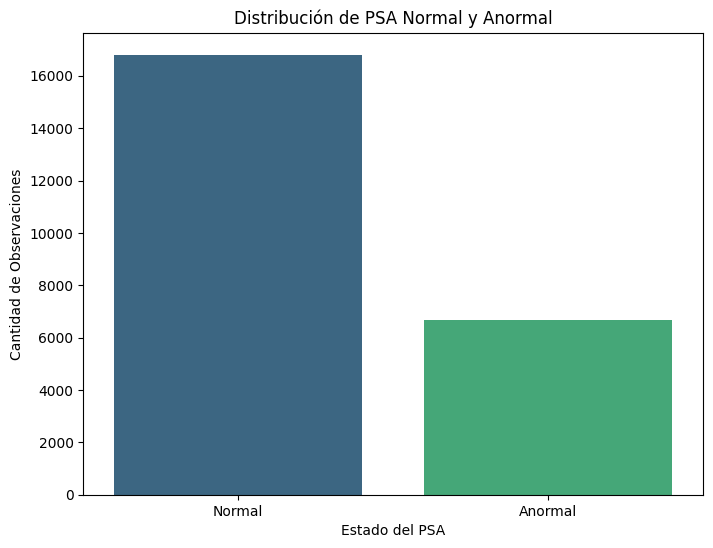

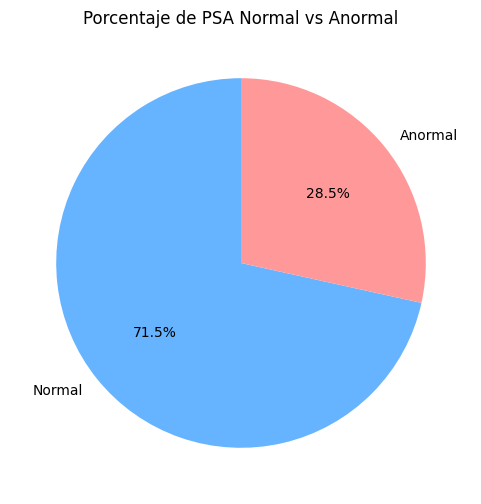

In [10]:
# Llamamos a la funcion con nuestro dataframe df_train
plot_target_distribution(df_train)


Encontramos que la base de datos no está aceptablemente balanceada, con un 28.5% de los individuos presentando una un estado anormal de PSA.

- Características adicionales y demográficas (medicamentos, imc, estado de salud general, historial médico).

In [11]:
# Información general del dataset
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Index: 23494 entries, 16484 to 9409
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   MEDICAMENTOS                   23494 non-null  float64
 1   MEDICINA ESPECIALIZADA         23494 non-null  float64
 2   MEDICINA GENERAL               23494 non-null  float64
 3   Cant_gr_flia                   23494 non-null  int64  
 4   Cant_riesgos_flia_mean         23494 non-null  float64
 5   min_Tiempo_CP_Fliar            8 non-null      float64
 6   Cant_Fliar_CP                  23494 non-null  float64
 7   psa_max_gr_flia                164 non-null    float64
 8   psa_min_gr_flia                164 non-null    float64
 9   Cant_Fliar_riesgos             23494 non-null  float64
 10  cantidad_serv_flia             23494 non-null  float64
 11  Pendiente_flia                 23494 non-null  float64
 12  Intercepto_flia                23494 non-null  f

In [12]:
# Descripción estadística de variables numéricas
#print(df_train.describe())
df_train.describe()

,MEDICAMENTOS,MEDICINA ESPECIALIZADA,MEDICINA GENERAL,Cant_gr_flia,Cant_riesgos_flia_mean,min_Tiempo_CP_Fliar,Cant_Fliar_CP,psa_max_gr_flia,psa_min_gr_flia,Cant_Fliar_riesgos,...,RIESGOS,CANTIDAD_SERVICIOS,PERDIDA_DE_PESO,TIEMPO_ULTIMA_CITA,conteo_dx_diferentes,TIEMPO_AFILIACION,Target,Pendiente,Intercepto,Promedio_costo
count,23494.000000,23494.000000,23494.000000,23494.000000,23494.000000,8.000000,23494.000000,164.000000,164.000000,23494.000000,...,7211.000000,23494.000000,5771.000000,23494.000000,23494.000000,23494.000000,23494.000000,2.349400e+04,2.349400e+04,2.349400e+04
mean,5.201669,1.285094,1.244190,2.451392,0.227974,95.000000,0.000341,8.538970,2.986841,0.291947,...,1.492997,8.861156,0.170005,2.219928,2.918532,135.953520,0.284626,1.485093e+04,1.495688e+05,3.107291e+05
std,8.830948,2.669005,1.337775,1.153336,0.485658,86.194133,0.018450,44.400913,4.734082,0.454761,...,0.792335,12.090472,8.040427,3.991257,2.193799,104.881494,0.451246,4.270672e+05,1.854731e+06,1.424497e+06
min,0.000000,0.000000,0.000000,1.000000,0.000000,23.000000,0.000000,0.005000,0.000000,0.000000,...,1.000000,1.000000,-62.500000,1.000000,1.000000,7.000000,0.000000,-2.030057e+07,-3.337852e+07,1.000000e+00
25%,0.000000,0.000000,0.000000,2.000000,0.000000,41.000000,0.000000,0.978750,0.845750,0.000000,...,1.000000,2.000000,-2.560000,1.000000,1.000000,38.000000,0.000000,-4.412050e+03,-1.678853e+04,3.267192e+04
50%,2.000000,0.000000,1.000000,2.000000,0.000000,73.000000,0.000000,2.420000,1.785000,0.000000,...,1.000000,5.000000,0.000000,1.000000,2.000000,103.000000,0.000000,3.118857e+03,4.090667e+03,7.961250e+04
75%,6.000000,1.000000,2.000000,3.000000,0.333333,102.250000,0.000000,4.995000,3.552500,1.000000,...,2.000000,11.000000,2.270000,2.000000,4.000000,244.000000,1.000000,1.459710e+04,7.573733e+04,1.793700e+05
max,91.000000,44.000000,23.000000,10.000000,6.000000,284.000000,1.000000,550.000000,49.000000,2.000000,...,8.000000,262.000000,157.140000,36.000000,25.000000,350.000000,1.000000,1.490708e+07,1.013168e+08,9.516344e+07


In [13]:
# Descripción estadística de variables categóricas
#print(df_train.describe(include=['object', 'category']))
df_train.describe(include=['object', 'category'])

,ESTADO_CIVI,PROGRAMA,estrato,IMC,AGRUPACION_SISTOLICA,AGRUPACION_DIASTOLICA,parentesco,CANCER_MAMA_FAMILIAR,CANCER_OTRO_SITIO,CANCER_OTRO_SITIO_FAMILIAR,...,HIPERTENSION_FAMILIAR,DIABETES,DIABETES_FAMILIAR,CORONARIOS,CORONARIOS_FAMILIAR,CEREBRAL,CEREBRAL_FAMILIAR,ENFERMEDAD_RENAL,ENFERMEDAD_RENAL_FAMILIAR,OTROS_ANTECEDENTES_VASCULARES
count,23494,23494,23494,13130,20174,20174,23494,16692,23494,23494,...,23494,23494,23494,23494,23494,23494,23494,23494,23494,23494
unique,6,3,5,4,3,3,7,2,3,3,...,3,3,3,3,3,3,3,3,3,3
top,CA,POS,1,Sobrepeso,Normal,Normal,None,0,0,0,...,0,0,0,0,0,0,0,0,0,0
freq,10694,21521,17675,6549,18321,17111,17125,16332,13320,13638,...,11576,13142,13421,14479,15208,15261,16288,15356,16527,16082


In [14]:
# Obtener los tipos de datos
print(df_train.dtypes)

MEDICAMENTOS                     float64
MEDICINA ESPECIALIZADA           float64
MEDICINA GENERAL                 float64
Cant_gr_flia                       int64
Cant_riesgos_flia_mean           float64
min_Tiempo_CP_Fliar              float64
Cant_Fliar_CP                    float64
psa_max_gr_flia                  float64
psa_min_gr_flia                  float64
Cant_Fliar_riesgos               float64
cantidad_serv_flia               float64
Pendiente_flia                   float64
Intercepto_flia                  float64
Promedio_costo_flia              float64
ESTADO_CIVI                       object
PROGRAMA                          object
estrato                           object
IMC                               object
AGRUPACION_SISTOLICA              object
AGRUPACION_DIASTOLICA             object
parentesco                        object
EDAD                             float64
RIESGOS                          float64
CANTIDAD_SERVICIOS               float64
PERDIDA_DE_PESO 

- Análisis Univariado

    Antes de explorar las relaciones entre variables, es útil analizar cada variable individualmente.

    - Variables Numéricas
        Para cada variable numérica:
        - Histograma: Para ver la distribución.
        - Boxplot: Para identificar outliers.

In [15]:
def plot_numerical_variables(df, numerical_vars=None, figsize=(20, 4)):
    """
    Genera histogramas y boxplots para variables numéricas en un DataFrame.

    Parámetros:
    - df: DataFrame que contiene los datos.
    - numerical_vars: Lista de variables numéricas a graficar. Si es None, se seleccionan automáticamente.
    - figsize: Tamaño de la figura para cada variable (ancho, alto).

    Retorna:
    - None
    """
    if numerical_vars is None:
        numerical_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    
    for var in numerical_vars:
        plt.figure(figsize=figsize)
        
        plt.subplot(1, 2, 1)
        sns.histplot(df[var].dropna(), kde=True)
        plt.title(f'Distribución de {var}')
        plt.xlabel(var)
        plt.ylabel('Frecuencia')
        
        plt.subplot(1, 2, 2)
        sns.boxplot(x=df[var])
        plt.title(f'Boxplot de {var}')
        plt.xlabel(var)
        
        plt.tight_layout()
        plt.show()


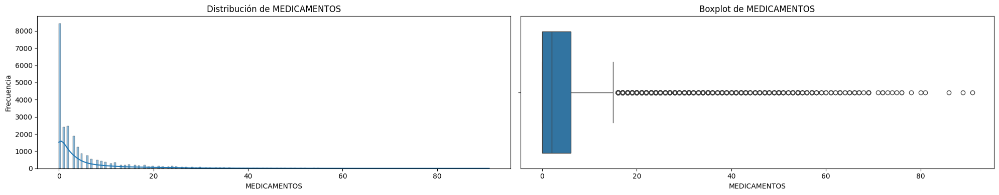

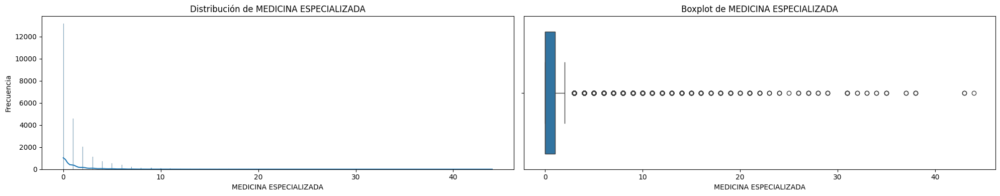

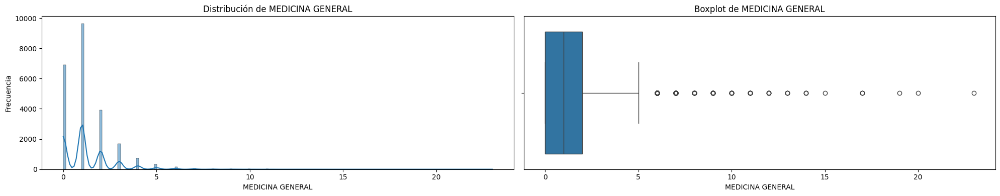

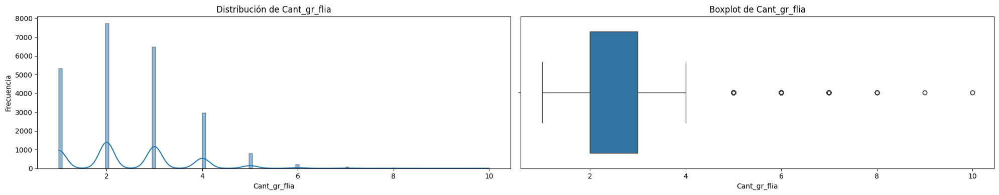

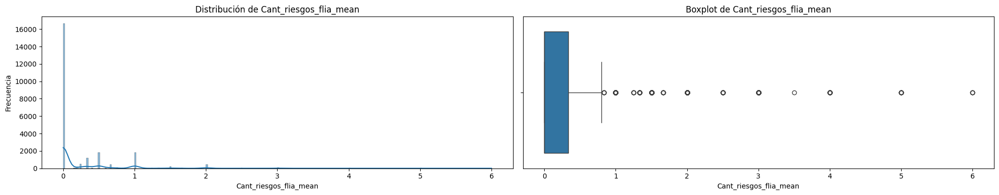

...

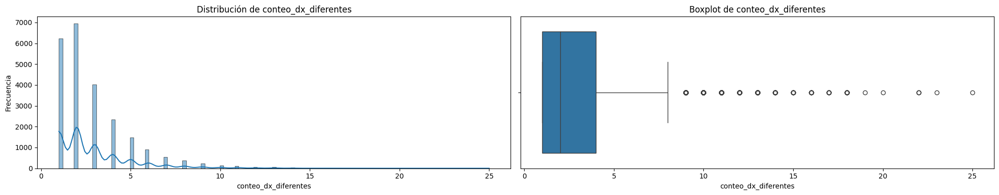

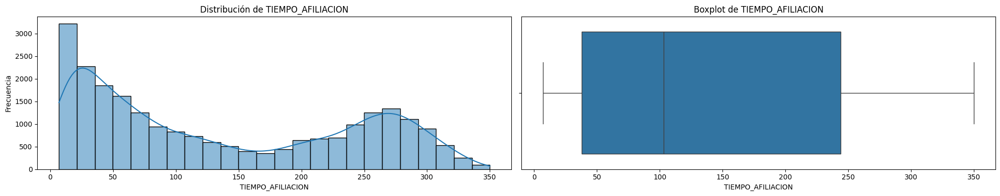

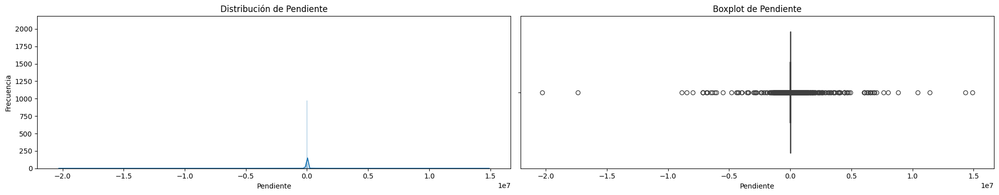

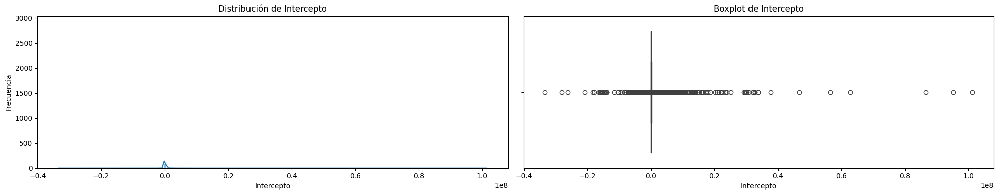

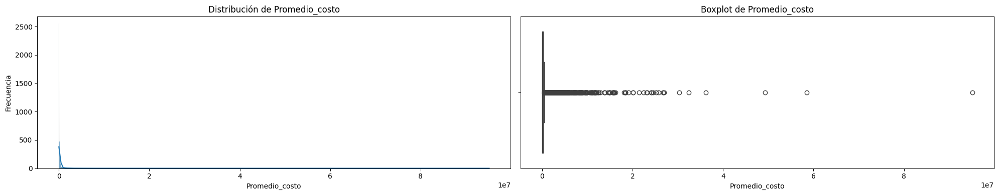

In [16]:
# Llamamos a la función con nuestro dataframe df_train
plot_numerical_variables(df_train)

- Análisis Univariado

    Antes de explorar las relaciones entre variables, es útil analizar cada variable individualmente.
    - Variables Categóricas
        Para cada variable categórica:
        - Conteo de categorías: Usando gráficos de barras.

In [17]:
def plot_categorical_variables(df, n_cols=3, rotation=45, figsize_multiplier=(6, 5)):
    """
    Genera gráficos de barras para variables categóricas en un DataFrame,
    incluyendo etiquetas de frecuencia en cada barra.

    Parámetros:
    - df: DataFrame que contiene los datos.
    - n_cols: Número de gráficos por fila (columnas en la cuadrícula).
    - rotation: Grados de rotación de las etiquetas del eje X.
    - figsize_multiplier: Tupla que multiplica el tamaño de la figura (ancho, alto) por (n_cols, n_rows).

    Retorna:
    - None
    """

    # Seleccionamos las variables categóricas
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    n_vars = len(categorical_vars)

    if n_vars == 0:
        print("No hay variables categóricas en el DataFrame.")
        return

    # Calculamos el número de filas necesario
    n_rows = math.ceil(n_vars / n_cols)

    # Creamos la figura y los ejes
    figsize = (n_cols * figsize_multiplier[0], n_rows * figsize_multiplier[1])
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    # Iteramos sobre las variables categóricas y los ejes
    for idx, var in enumerate(categorical_vars):
        sns.countplot(x=var, data=df, ax=axes[idx])
        axes[idx].set_title(f'Distribución de {var}')
        axes[idx].tick_params(axis='x', rotation=rotation)
        axes[idx].set_xlabel(var)
        axes[idx].set_ylabel('Frecuencia')

        # Agregar etiquetas de frecuencia encima de las barras
        total = len(df)
        for p in axes[idx].patches:
            height = p.get_height()
            axes[idx].annotate(f'{int(height)}', 
                               (p.get_x() + p.get_width() / 2, height + 0.001 * total),
                               ha='center', va='bottom', fontsize=9)

    # Eliminar los subplots vacíos si los hay
    for i in range(idx + 1, n_rows * n_cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

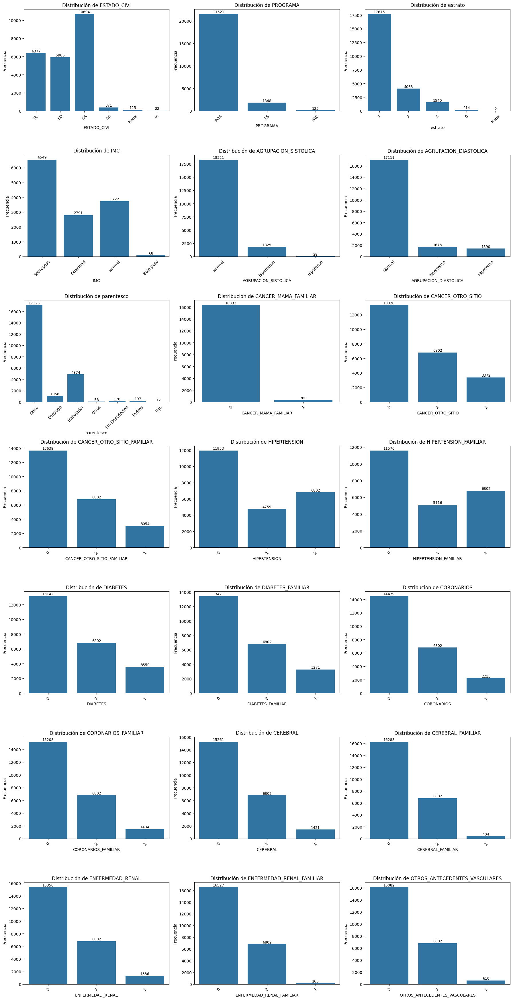

In [18]:
# Llamamos a la función con nuestro dataframe df_train
plot_categorical_variables(df_train)

- Análisis Bivariado

    Ahora, exploraremos cómo cada variable se relaciona con la variable objetivo 'Target'.

    - Variables Numéricas vs. Target
        - Boxplots por categoría de Target: Para comparar distribuciones.
        - Histogramas separados: Para ver distribuciones por clase.

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_numerical_vs_target(df, target_var='Target', numerical_vars=None, figsize=(20, 4)):
    """
    Genera boxplots y gráficos de densidad (KDE) para variables numéricas en función de la variable objetivo.

    Parámetros:
    - df: DataFrame que contiene los datos.
    - target_var: Nombre de la variable objetivo en el DataFrame.
    - numerical_vars: Lista de variables numéricas a graficar. Si es None, se seleccionan automáticamente.
    - figsize: Tamaño de la figura para cada variable (ancho, alto).

    Retorna:
    - None
    """
    # Si no se proporcionan numerical_vars, las seleccionamos del DataFrame
    if numerical_vars is None:
        numerical_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
        # Excluir la variable objetivo si es numérica
        if target_var in numerical_vars:
            numerical_vars.remove(target_var)

    # Verificar si hay variables numéricas
    if not numerical_vars:
        print("No se encontraron variables numéricas en el DataFrame.")
        return

    for var in numerical_vars:
        plt.figure(figsize=figsize)
        
        # Boxplot de la variable vs Target
        plt.subplot(1, 2, 1)
        sns.boxplot(x=target_var, y=var, data=df)
        plt.title(f'{var} vs {target_var}')
        plt.xlabel(target_var)
        plt.ylabel(var)
        
        # Gráfico de densidad (KDE) de la variable por Target
        plt.subplot(1, 2, 2)
        sns.kdeplot(data=df, x=var, hue=target_var, fill=True)
        plt.title(f'Distribución de {var} por {target_var}')
        plt.xlabel(var)
        plt.ylabel('Densidad')
        
        plt.tight_layout()
        plt.show()

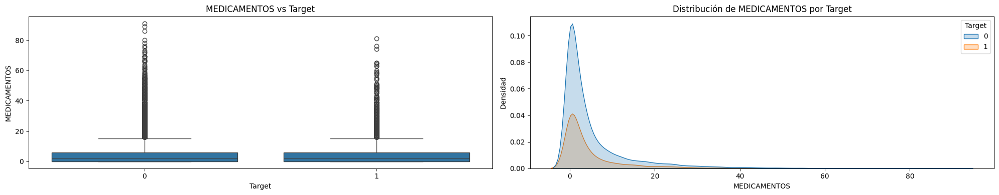

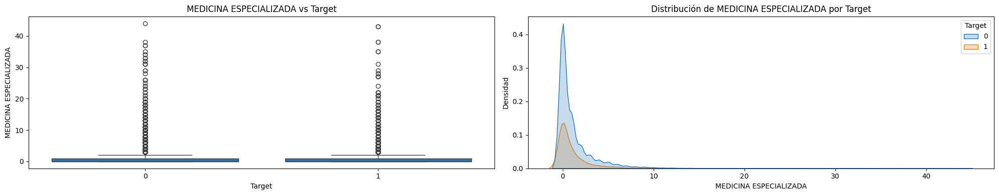

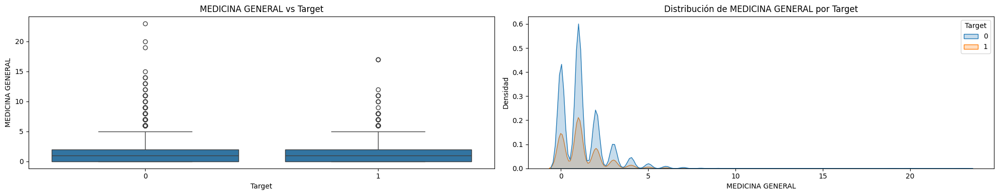

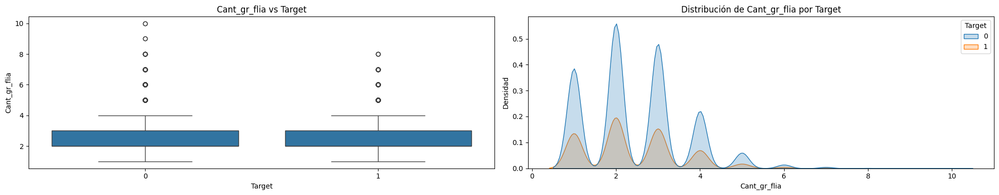

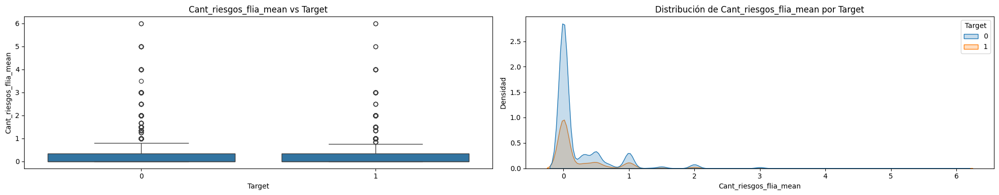

...

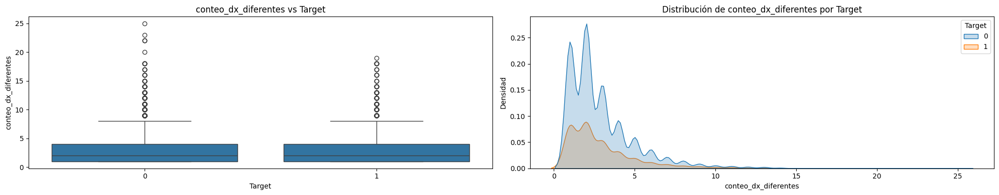

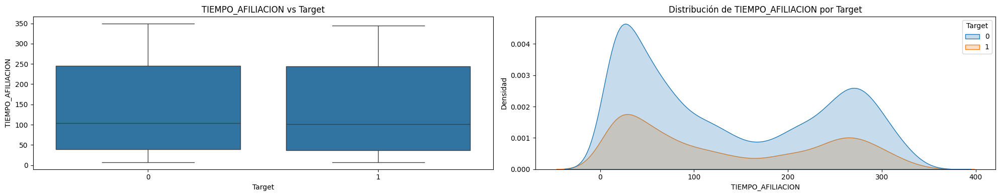

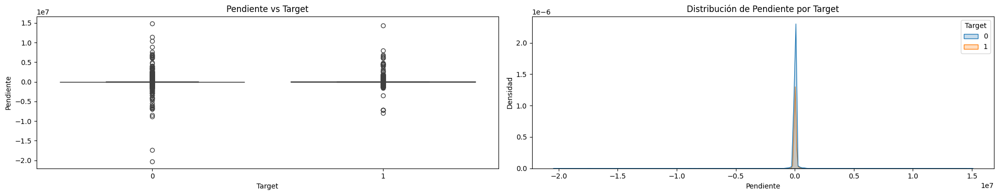

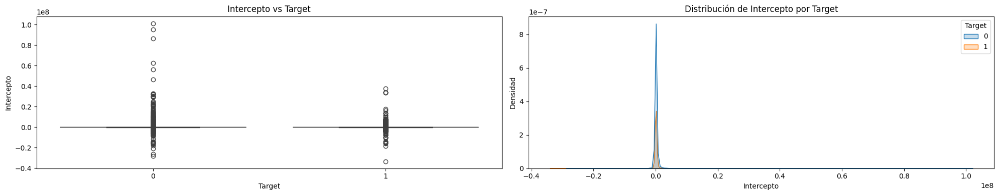

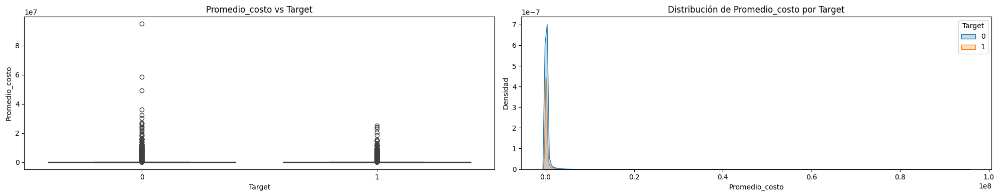

In [20]:
# Llamar a la función con nuestro dataframe df_train
plot_numerical_vs_target(df_train)

- Análisis Bivariado

    Ahora, exploraremos cómo cada variable se relaciona con la variable objetivo 'Target'.
    - Variables Categóricas vs. Target
        - Tablas de contingencia y gráficos de barras apilados: Para ver la distribución de 'Target' dentro de cada categoría.

In [21]:
def plot_categorical_vs_target(df, target_var='Target', n_cols=3, rotation=45, figsize_multiplier=(5, 4)):
    """
    Genera gráficos de conteo para variables categóricas en función de la variable objetivo.

    Parámetros:
    - df: DataFrame que contiene los datos.
    - target_var: Nombre de la variable objetivo en el DataFrame.
    - n_cols: Número de gráficos por fila (columnas en la cuadrícula).
    - rotation: Grados de rotación de las etiquetas del eje X.
    - figsize_multiplier: Tupla que multiplica el tamaño de la figura (ancho, alto) por (n_cols, n_rows).

    Retorna:
    - None
    """
    # Seleccionamos las variables categóricas
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    n_vars = len(categorical_vars)

    if n_vars == 0:
        print("No hay variables categóricas en el DataFrame.")
        return

    # Definimos el número de filas necesario
    n_rows = math.ceil(n_vars / n_cols)

    # Creamos la figura y los ejes
    figsize = (n_cols * figsize_multiplier[0], n_rows * figsize_multiplier[1])
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    # Iteramos sobre las variables categóricas y los ejes
    for idx, var in enumerate(categorical_vars):
        sns.countplot(x=var, hue=target_var, data=df, ax=axes[idx])
        axes[idx].set_title(f'Distribución de {var} por {target_var}')
        axes[idx].tick_params(axis='x', rotation=rotation)
        axes[idx].set_xlabel(var)
        axes[idx].set_ylabel('Frecuencia')
        for p in axes[idx].patches:
            height = p.get_height()
            axes[idx].annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2, height + 0.03),
                       ha='center', va='bottom', fontsize=7)


    # Eliminar los subplots vacíos si los hay
    for i in range(idx + 1, n_rows * n_cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

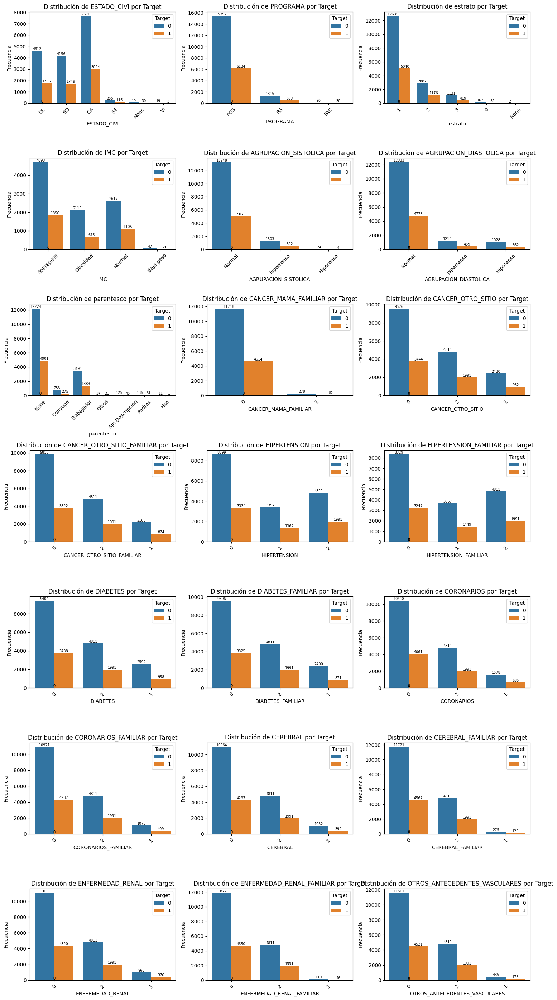

In [22]:
# Llamamos a la funcion con nuestro dataframe df_train
plot_categorical_vs_target(df_train)

In [23]:
def plot_categorical_distributions(df, target_var, n_cols=3, normal_color='#66b3ff', anormal_color='#ff9999', figsize_multiplier=(6, 5)):
    """
    Genera gráficos de barras apiladas para cada variable categórica en un DataFrame, mostrando la proporción
    de las categorías de una variable objetivo dentro de cada variable categórica.

    Parámetros:
    - df: DataFrame que contiene las variables categóricas y la variable objetivo.
    - target_var: Nombre de la variable objetivo (debe ser binaria o categórica).
    - n_cols: Número de gráficos por fila (predeterminado: 3).
    - normal_color: Color de las barras de la categoría 'Normal' (predeterminado: '#66b3ff').
    - anormal_color: Color de las barras de la categoría 'Anormal' (predeterminado: '#ff9999').
    - figsize_multiplier: Multiplicador para el tamaño de la figura (predeterminado: (6, 5)).

    Retorna:
    - Muestra los gráficos de distribución apilados.
    """

    # Seleccionar variables categóricas
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    n_vars = len(categorical_vars)
    
    if n_vars == 0:
        print("No hay variables categóricas en el DataFrame.")
        return


    # Calcular el número de filas necesario
    n_rows = math.ceil(n_vars / n_cols)

    # Crear la figura y los ejes
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * figsize_multiplier[0], n_rows * figsize_multiplier[1]))
    axes = axes.flatten()  # Aplanamos la matriz de ejes para facilitar la iteración

    # Iterar sobre las variables categóricas y los ejes para generar los gráficos
    for idx, var in enumerate(categorical_vars):
        cross_tab = pd.crosstab(df[var], df[target_var], normalize='index')
        cross_tab = cross_tab.reset_index()

        # Asegurarnos de que las columnas están ordenadas correctamente
        cross_tab = cross_tab.rename(columns={0: 'Normal', 1: 'Anormal'})

        # Crear el gráfico de barras apiladas
        bars_normal = axes[idx].bar(x=cross_tab[var], height=cross_tab['Normal'], label='Normal', color=normal_color)
        bars_anormal = axes[idx].bar(x=cross_tab[var], height=cross_tab['Anormal'], bottom=cross_tab['Normal'], label='Anormal', color=anormal_color)

        # Agregar etiquetas de porcentaje
        for i in range(len(cross_tab)):
            normal_height = cross_tab['Normal'].iloc[i]
            anormal_height = cross_tab['Anormal'].iloc[i]
            total_height = normal_height + anormal_height

            # Etiqueta para la categoría 'Normal'
            if normal_height > 0:
                axes[idx].text(i, normal_height / 2, f'{normal_height * 100:.1f}%', ha='center', va='center', color='white', fontsize=10)
            # Etiqueta para la categoría 'Anormal'
            if anormal_height > 0:
                axes[idx].text(i, normal_height + anormal_height / 2, f'{anormal_height * 100:.1f}%', ha='center', va='center', color='white', fontsize=10)

        axes[idx].set_title(f'Distribución de {target_var} dentro de {var}')
        axes[idx].set_ylabel('Proporción')
        axes[idx].set_xlabel(var)
        axes[idx].legend(title=target_var, labels=['Normal', 'Anormal'])
        axes[idx].tick_params(axis='x', rotation=45)

    # Eliminar los subplots vacíos si los hay
    for i in range(idx + 1, n_rows * n_cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

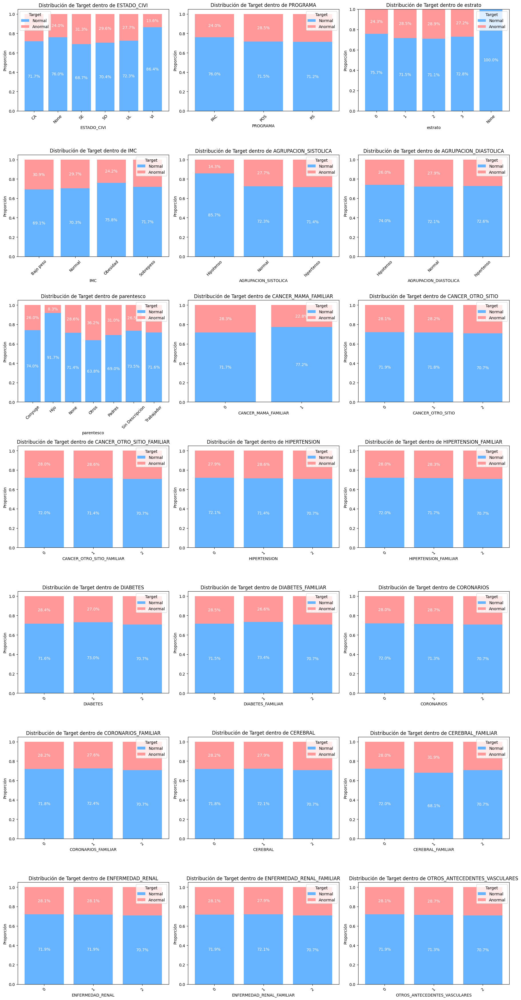

In [24]:
# Llamamos a la funcion con nuestro dataframe df_train
plot_categorical_distributions(df_train, 'Target', n_cols=3)

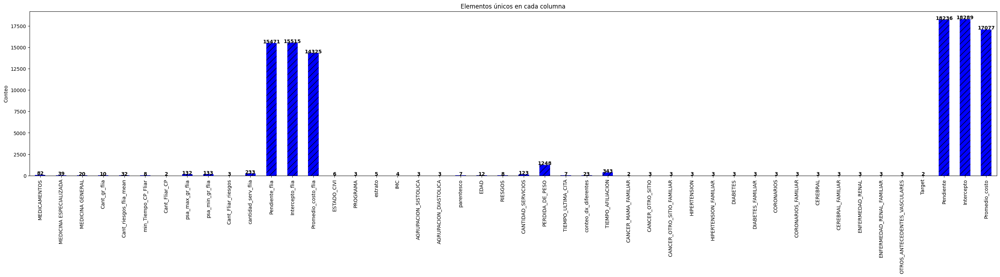

In [25]:
# Observamos valores únicos de las variables
unique = df_train.nunique()
plt.figure(figsize=(35, 6))
unique.plot(kind='bar', color='blue', hatch='//')
plt.title('Elementos únicos en cada columna')
plt.ylabel('Conteo')
for i, v in enumerate(unique.values):
    plt.text(i, v+1, str(v), color='black', fontweight='bold', ha='center')
plt.show()

- Visualización de correlaciones entre las características y el resultado de PSA.

    Vamos a utilizar la matriz de correlación para corroborar los indicios sobre las relaciones presentes entre algunas de las características y la variable objetivo.
    - Al contar con variables categóricas (la dependiente y varias dependientes) no podemos utilizar la matriz de correlación clásica que utiliza el coeficiente de correlación de Pearson ya que este tan sólo nos sirve para relación entre variables continuas.
    - Al haber varias características categóricas utilizamos la función associations de dython que utiliza el coeficiente de Pearson para continuas vs continuas, la razón de correlación para continuas vs categóricas y Cramer's V o Theil's U para categóricas vs categóricas

In [26]:
categorical_features=identify_nominal_columns(df_train)
continuous_features=identify_numeric_columns(df_train)

In [27]:
categorical_features

['ESTADO_CIVI',
 'PROGRAMA',
 'estrato',
 'IMC',
 'AGRUPACION_SISTOLICA',
 'AGRUPACION_DIASTOLICA',
 'parentesco',
 'CANCER_MAMA_FAMILIAR',
 'CANCER_OTRO_SITIO',
 'CANCER_OTRO_SITIO_FAMILIAR',
 'HIPERTENSION',
 'HIPERTENSION_FAMILIAR',
 'DIABETES',
 'DIABETES_FAMILIAR',
 'CORONARIOS',
 'CORONARIOS_FAMILIAR',
 'CEREBRAL',
 'CEREBRAL_FAMILIAR',
 'ENFERMEDAD_RENAL',
 'ENFERMEDAD_RENAL_FAMILIAR',
 'OTROS_ANTECEDENTES_VASCULARES']

In [28]:
continuous_features

['MEDICAMENTOS',
 'MEDICINA ESPECIALIZADA',
 'MEDICINA GENERAL',
 'Cant_gr_flia',
 'Cant_riesgos_flia_mean',
 'min_Tiempo_CP_Fliar',
 'Cant_Fliar_CP',
 'psa_max_gr_flia',
 'psa_min_gr_flia',
 'Cant_Fliar_riesgos',
 'cantidad_serv_flia',
 'Pendiente_flia',
 'Intercepto_flia',
 'Promedio_costo_flia',
 'EDAD',
 'RIESGOS',
 'CANTIDAD_SERVICIOS',
 'PERDIDA_DE_PESO',
 'TIEMPO_ULTIMA_CITA',
 'conteo_dx_diferentes',
 'TIEMPO_AFILIACION',
 'Pendiente',
 'Intercepto',
 'Promedio_costo']

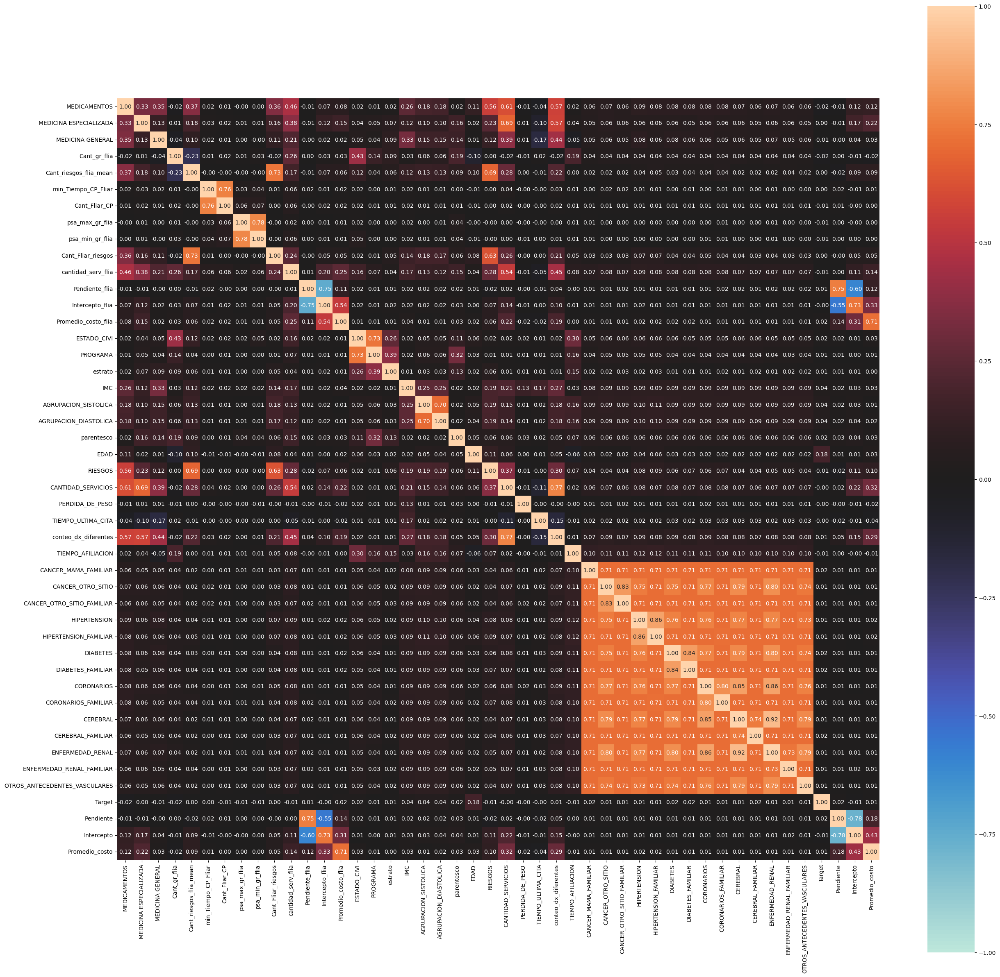

In [29]:
complete_correlation= associations(df_train, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Images\Complete_correlation.png', figsize=(30,30))

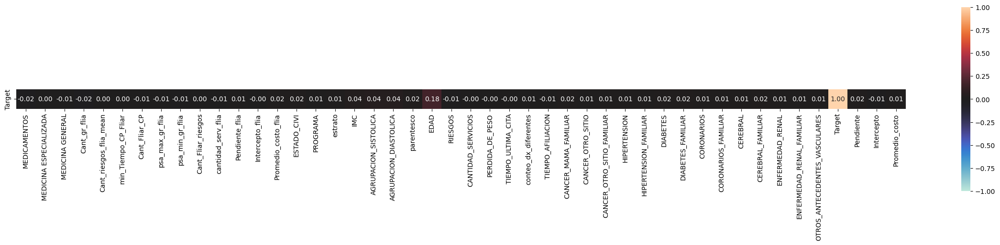

In [30]:
target_correlation= associations(df_train, display_rows=['Target'], filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Images\Target_correlation.png', figsize=(30,5))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7) en orden descendente es decir de mayor a menor importancia:
- EDAD 0.18

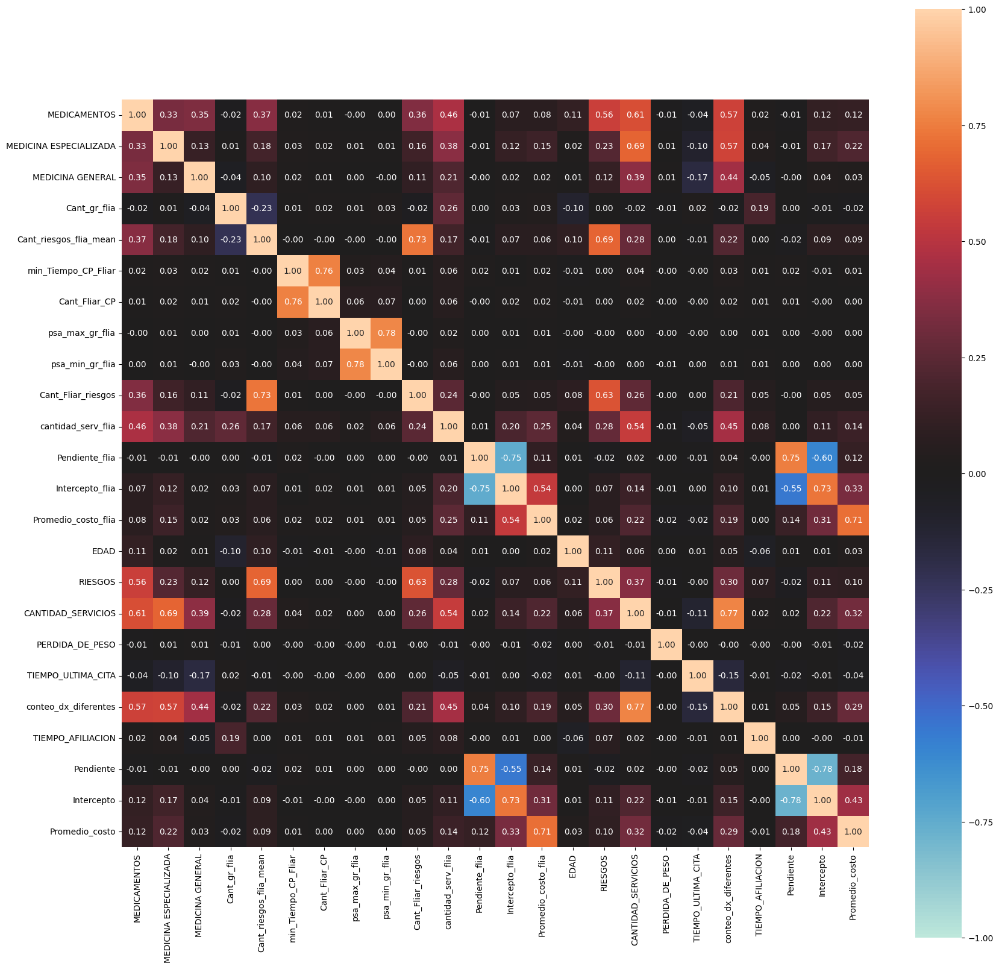

In [31]:
# Obtenemos la matriz de correlación entre las variables continuas
selected_column= df_train[continuous_features]
continuous_df = selected_column.copy()

continuous_correlation= associations(continuous_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Images\Continuous_correlation.png', figsize=(20,20))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7) en orden descendente es decir de mayor a menor importancia:

Revisamos aquellas variables independientes continuas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (problemas de multicolinealidad, redundancia, complejitud innecesaria del modelo):
- **psa_max_gr_flia** y **psa_min_gr_flia** *0.78*
- **Pendiente** e **Intercepto** *-0.78*
- **CANTIDAD_SERVICIOS** y **conteo_dx_diferentes** *0.77*
- **min_Tiempo_CP_Fliar** y **Cant_Fliar_CP** *0.76*
- **Pendiente_flia** y **Pendiente** *0.75*
- **Pendiente_flia** y **Intercepto_flia** *-0.75*
- **Cant_riesgos_flia_mean** y **Cant_Fliar_riesgos** *0.73*
- **Intercepto_flia** y **Intercepto** *0.73*
- **Promedio_costo_flia** y **Promedio_costo** *0.71*
- **Cant_riesgos_flia_mean** y **RIESGOS** *0.69*
- **CANTIDAD_SERVICIOS** y **MEDICINA_ESPECIALIZADA** *0.69*
- **Cant_Fliar_riesgos** y **RIESGOS** *0.63*

Estas relaciones nos ayudarán a decidir el tema de eliminación de variables.

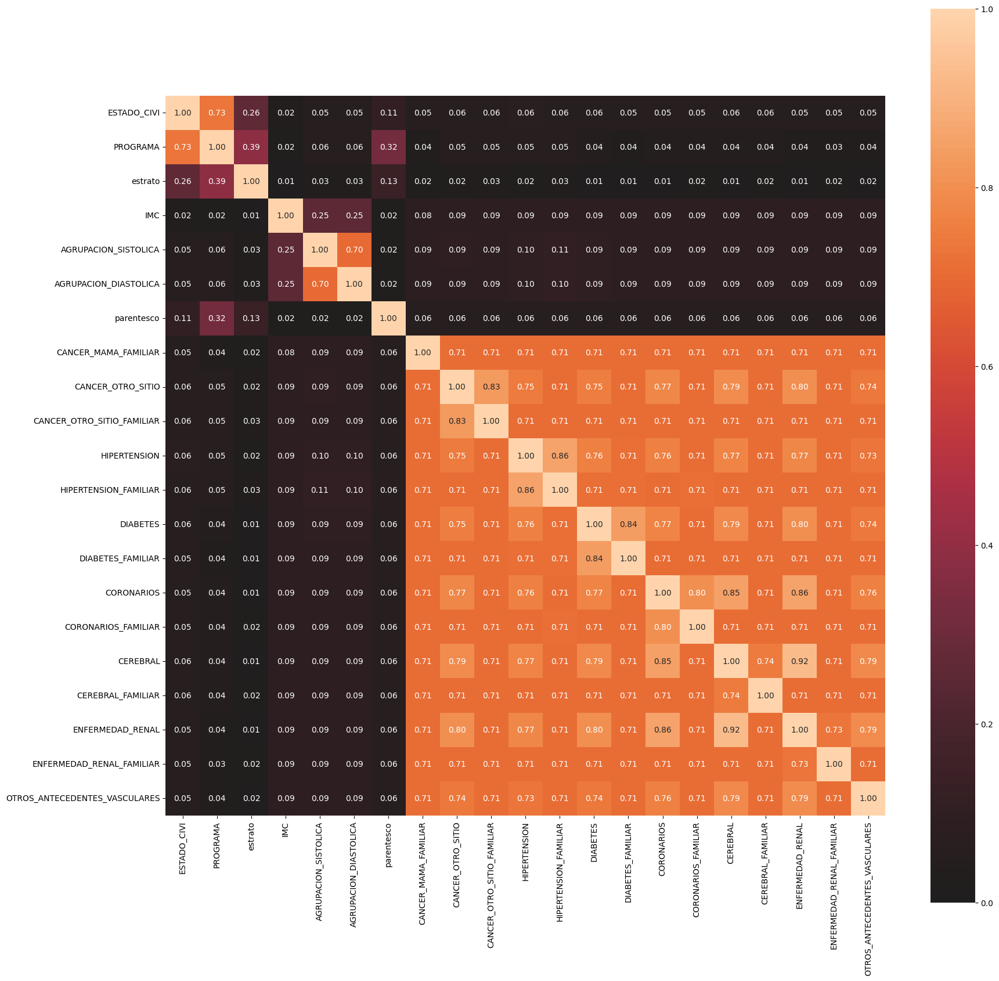

In [32]:
# Obtenemos la matriz de correlación entre las variables categoricas
selected_column= df_train[categorical_features]
categorical_df = selected_column.copy()

categorical_correlation= associations(categorical_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\2do semestre\Fundamentos de analitica II\Unidad II\Proyecto PSA\Images\Categorical_correlation.png', figsize=(20,20))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7) en orden descendente es decir de mayor a menor importancia:

Revisamos aquellas variables independientes continuas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (problemas de multicolinealidad, redundancia, complejitud innecesaria del modelo):

- **CEREBRAL** y **ENFERMEDAD_RENAL** *0.92*
- **CORONARIOS** y **ENFERMEDAD_RENAL** *0.86*
- **HIPERTENSION** y **HIPERTENSION_FAMILIAR** *0.86*
- **CORONARIOS** y **CEREBRAL** *0.85*
- **DIABETES** y **DIABETES_FAMILIAR** *0.84*
- **CANCER_OTRO_SITIO** y **CANCER_OTRO_SITIO_FAMILIAR** *0.83*
- **CANCER_OTRO_SITIO** y **ENFERMEDAD_RENAL** *0.80*
- **CORONARIOS** y **CORONARIOS_FAMILIAR** *0.80*
- **DIABETES** y **ENFERMEDAD_RENAL** *0.80*
- **CANCER_OTRO_SITIO** y **CEREBRAL** *0.79*
- **CEREBRAL** y **OTROS_ANTECEDENTES_VASCULARES** *0.79*
- **DIABETES** y **CEREBRAL** *0.79*
- **ENFERMEDAD_RENAL** y **OTROS_ANTECEDENTES_VASCULARES** *0.79*
- **CANCER_OTRO_SITIO** y **CORONARIOS** *0.77*
- **DIABETES** y **CORONARIOS** *0.77*
- **HIPERTENSION** y **ENFERMEDAD_RENAL** *0.77*
- **HIPERTENSION** y **CEREBRAL** *0.77*
- **CORONARIOS** y **OTROS_ANTECEDENTES_VASCULARES** *0.76*
- **HIPERTENSION** y **DIABETES** *0.76*
- **HIPERTENSION** y **CORONARIOS** *0.76*
- **CANCER_OTRO_SITIO** y **HIPERTENSION** *0.75*
- **CANCER_OTRO_SITIO** y **DIABETES** *0.75*
- **CANCER_OTRO_SITIO** y **OTROS_ANTECEDENTES_VASCULARES** *0.74*
- **CEREBRAL** y **CEREBRAL_FAMILIAR** *0.74*
- **DIABETES** y **OTROS_ANTECEDENTES_VASCULARES** *0.74*
- **ENFERMEDAD_RENAL** y **ENFERMEDAD_RENAL_FAMILIAR** *0.73*
- **HIPERTENSION** y **OTROS_ANTECEDENTES_VASCULARES** *0.73*
- **ESTADO_CIVI** y **PROGRAMA** *0.73*
- **CANCER_MAMA_FAMILIAR** y **CANCER_OTRO_SITIO** *0.71*
- **CANCER_MAMA_FAMILIAR** y **CANCER_OTRO_SITIO_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **HIPERTENSION** *0.71*
- **CANCER_MAMA_FAMILIAR** y **HIPERTENSION_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **DIABETES** *0.71*
- **CANCER_MAMA_FAMILIAR** y **DIABETES_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **CORONARIOS** *0.71*
- **CANCER_MAMA_FAMILIAR** y **CORONARIOS_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **CEREBRAL** *0.71*
- **CANCER_MAMA_FAMILIAR** y **CEREBRAL_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **CANCER_MAMA_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CANCER_MAMA_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **CANCER_OTRO_SITIO** y **HIPERTENSION_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO** y **DIABETES_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO** y **CORONARIOS_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO** y **CEREBRAL_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **HIPERTENSION** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **HIPERTENSION_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **DIABETES** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **DIABETES_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **CORONARIOS** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **CORONARIOS_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **CEREBRAL** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **CEREBRAL_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CANCER_OTRO_SITIO_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **CEREBRAL** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CEREBRAL_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **CEREBRAL_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CEREBRAL_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **CORONARIOS** y **CEREBRAL_FAMILIAR** *0.71*
- **CORONARIOS** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CORONARIOS_FAMILIAR** y **CEREBRAL** *0.71*
- **CORONARIOS_FAMILIAR** y **CEREBRAL_FAMILIAR** *0.71*
- **CORONARIOS_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **CORONARIOS_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **CORONARIOS_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **DIABETES** y **CORONARIOS_FAMILIAR** *0.71*
- **DIABETES** y **CEREBRAL_FAMILIAR** *0.71*
- **DIABETES** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **DIABETES_FAMILIAR** y **CORONARIOS** *0.71*
- **DIABETES_FAMILIAR** y **CORONARIOS_FAMILIAR** *0.71*
- **DIABETES_FAMILIAR** y **CEREBRAL** *0.71*
- **DIABETES_FAMILIAR** y **CEREBRAL_FAMILIAR** *0.71*
- **DIABETES_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **DIABETES_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **DIABETES_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **ENFERMEDAD_RENAL_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **HIPERTENSION** y **DIABETES_FAMILIAR** *0.71*
- **HIPERTENSION** y **CORONARIOS_FAMILIAR** *0.71*
- **HIPERTENSION** y **CEREBRAL_FAMILIAR** *0.71*
- **HIPERTENSION** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **HIPERTENSION_FAMILIAR** y **DIABETES** *0.71*
- **HIPERTENSION_FAMILIAR** y **DIABETES_FAMILIAR** *0.71*
- **HIPERTENSION_FAMILIAR** y **CORONARIOS** *0.71*
- **HIPERTENSION_FAMILIAR** y **CORONARIOS_FAMILIAR** *0.71*
- **HIPERTENSION_FAMILIAR** y **CEREBRAL** *0.71*
- **HIPERTENSION_FAMILIAR** y **CEREBRAL_FAMILIAR** *0.71*
- **HIPERTENSION_FAMILIAR** y **ENFERMEDAD_RENAL** *0.71*
- **HIPERTENSION_FAMILIAR** y **ENFERMEDAD_RENAL_FAMILIAR** *0.71*
- **HIPERTENSION_FAMILIAR** y **OTROS_ANTECEDENTES_VASCULARES** *0.71*
- **AGRUPACION_SISTOLICA** y **AGRUPACION_DIASTOLICA** *0.70*

De la lista anterior daremos prioridad de observación a estos, debido al alto grado de correlación para nuestras posteriores desiciones 

- **CEREBRAL** y **ENFERMEDAD_RENAL** *0.92*
- **CORONARIOS** y **ENFERMEDAD_RENAL** *0.86*
- **HIPERTENSION** y **HIPERTENSION_FAMILIAR** *0.86*
- **CORONARIOS** y **CEREBRAL** *0.85*
- **DIABETES** y **DIABETES_FAMILIAR** *0.84*
- **CANCER_OTRO_SITIO** y **CANCER_OTRO_SITIO_FAMILIAR** *0.83*
- **CANCER_OTRO_SITIO** y **ENFERMEDAD_RENAL** *0.80*
- **CORONARIOS** y **CORONARIOS_FAMILIAR** *0.80*
- **DIABETES** y **ENFERMEDAD_RENAL** *0.80*
- **CANCER_OTRO_SITIO** y **CEREBRAL** *0.79*
- **CEREBRAL** y **OTROS_ANTECEDENTES_VASCULARES** *0.79*
- **DIABETES** y **CEREBRAL** *0.79*
- **ENFERMEDAD_RENAL** y **OTROS_ANTECEDENTES_VASCULARES** *0.79*
- **CANCER_OTRO_SITIO** y **CORONARIOS** *0.77*
- **DIABETES** y **CORONARIOS** *0.77*
- **HIPERTENSION** y **ENFERMEDAD_RENAL** *0.77*
- **HIPERTENSION** y **CEREBRAL** *0.77*
- **CORONARIOS** y **OTROS_ANTECEDENTES_VASCULARES** *0.76*
- **HIPERTENSION** y **DIABETES** *0.76*
- **HIPERTENSION** y **CORONARIOS** *0.76*
- **CANCER_OTRO_SITIO** y **HIPERTENSION** *0.75*
- **CANCER_OTRO_SITIO** y **DIABETES** *0.75*
- **CANCER_OTRO_SITIO** y **OTROS_ANTECEDENTES_VASCULARES** *0.74*
- **CEREBRAL** y **CEREBRAL_FAMILIAR** *0.74*
- **DIABETES** y **OTROS_ANTECEDENTES_VASCULARES** *0.74*
- **ENFERMEDAD_RENAL** y **ENFERMEDAD_RENAL_FAMILIAR** *0.73*
- **HIPERTENSION** y **OTROS_ANTECEDENTES_VASCULARES** *0.73*
- **ESTADO_CIVI** y **PROGRAMA** *0.73*

Por último haremos uso de la correlación tradicional (Coeficiente de correlación de Pearson)

In [33]:
# Calculamos la matriz de correlación
corr_matrix = continuous_df.corr()

# Convertimos la matriz de correlación en un DataFrame de pares de variables
corr_pairs = corr_matrix.unstack()

# Convertimos la Serie en un DataFrame y renombramos las columnas
corr_pairs = pd.DataFrame(corr_pairs, columns=['Correlación']).reset_index()
corr_pairs.columns = ['Variable_1', 'Variable_2', 'Correlación']

# Eliminamos los pares duplicados y las autocorrelaciones
corr_pairs['Par'] = corr_pairs.apply(lambda x: '-'.join(sorted([x['Variable_1'], x['Variable_2']])), axis=1)
corr_pairs = corr_pairs.drop_duplicates(subset='Par')
corr_pairs = corr_pairs[corr_pairs['Variable_1'] != corr_pairs['Variable_2']]

# Ordenamos las correlaciones de mayor a menor valor absoluto
corr_pairs['Correlación_abs'] = corr_pairs['Correlación'].abs()
corr_pairs = corr_pairs.sort_values(by='Correlación_abs', ascending=False)

# Eliminamos la columna auxiliar 'Correlación_abs' y 'Par'
corr_pairs = corr_pairs.drop(columns=['Correlación_abs', 'Par'])

# Reiniciamos el índice del DataFrame
corr_pairs = corr_pairs.reset_index(drop=True)

# Mostramos el resultado
print(corr_pairs)

              Variable_1            Variable_2  Correlación
0    min_Tiempo_CP_Fliar       PERDIDA_DE_PESO     0.999203
1    min_Tiempo_CP_Fliar        Promedio_costo     0.874545
2    min_Tiempo_CP_Fliar             Pendiente     0.874465
3    min_Tiempo_CP_Fliar            Intercepto    -0.868506
4        psa_max_gr_flia       psa_min_gr_flia     0.813872
..                   ...                   ...          ...
271                 EDAD       PERDIDA_DE_PESO     0.001537
272      psa_max_gr_flia  conteo_dx_diferentes    -0.000894
273     MEDICINA GENERAL             Pendiente    -0.000503
274      Intercepto_flia                  EDAD     0.000489
275  min_Tiempo_CP_Fliar         Cant_Fliar_CP          NaN

[276 rows x 3 columns]


In [34]:
# Observemos las 10 correlaciones más altas
top_10_corr = corr_pairs.head(10)
print('Top 10 correlaciones más altas:')
print(top_10_corr)

Top 10 correlaciones más altas:
            Variable_1            Variable_2  Correlación
0  min_Tiempo_CP_Fliar       PERDIDA_DE_PESO     0.999203
1  min_Tiempo_CP_Fliar        Promedio_costo     0.874545
2  min_Tiempo_CP_Fliar             Pendiente     0.874465
3  min_Tiempo_CP_Fliar            Intercepto    -0.868506
4      psa_max_gr_flia       psa_min_gr_flia     0.813872
5            Pendiente            Intercepto    -0.779617
6   CANTIDAD_SERVICIOS  conteo_dx_diferentes     0.769036
7       Pendiente_flia             Pendiente     0.754882
8       Pendiente_flia       Intercepto_flia    -0.745878
9  min_Tiempo_CP_Fliar    CANTIDAD_SERVICIOS     0.737751


In [35]:
def plot_pairplot_with_target(df, target_var, diag_kind='kde'):
    """
    Genera un pairplot de las variables numéricas de un DataFrame, destacando las categorías de la variable objetivo.

    Parámetros:
    - df: DataFrame que contiene las variables numéricas y la variable objetivo.
    - target_var: Nombre de la variable objetivo para colorear los gráficos.
    - diag_kind: Tipo de gráfico para la diagonal ('kde' o 'hist', por defecto 'kde').

    Retorna:
    - Un gráfico pairplot con las variables numéricas coloreadas según la variable objetivo.
    """
    
    # Seleccionar variables numéricas
    numerical_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    num_vars = len(numerical_vars)
    
    if num_vars == 0:
        print("No hay variables numéricas en el DataFrame.")
        return

    # Asegurarnos de que el target está en la lista
    num_vars_with_target = numerical_vars + [target_var]
    n_vars = len(num_vars_with_target)
    
    if n_vars == 0:
        print("No hay variables numéricas en el DataFrame.")
        return

    # Generar el pairplot
    sns.pairplot(df[num_vars_with_target], hue=target_var, diag_kind=diag_kind)
    
    # Mostrar el gráfico
    plt.show()

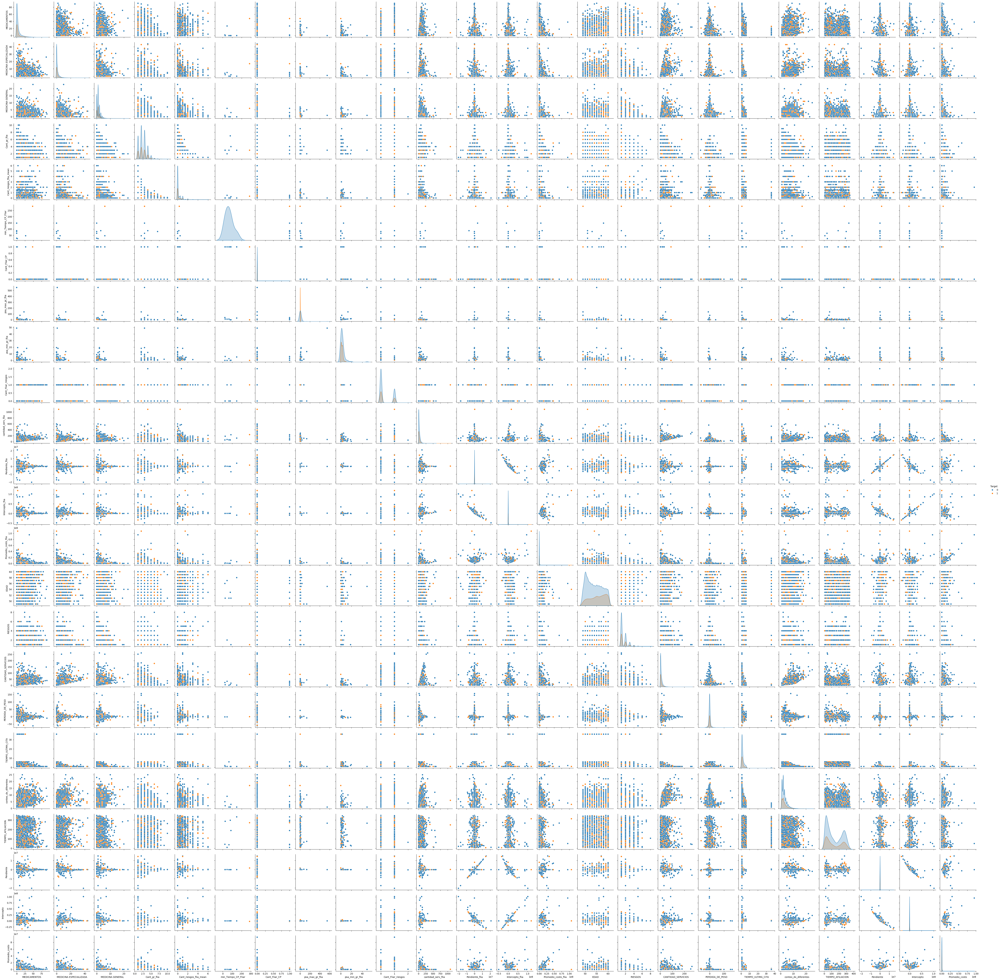

In [36]:
# Llamamos a la funcion con nuestro dataframe df_train y con la variable objetivo llamada 'Target'
plot_pairplot_with_target(df_train, 'Target')

- Detectar valores faltantes, outliers, y estudiar las relaciones de las características con la variable objetivo.

Cálculo de los z-scores: El z-score mide cuántas desviaciones estándar se aleja un valor de la media de la variable. Se calcula utilizando la fórmula:

𝑧 = ( 𝑥 − 𝜇 ) / 𝜎

donde:
- 𝑥 es el valor individual de la observación.
- 𝜇 es la media de todos los valores de la variable.
- 𝜎 es la desviación estándar de la variable.

Criterio de detección: Se consideran outliers los valores que se encuentran a más de 3 desviaciones estándar de la media (según la Regla Empírica o Regla 68-95-99.7).

Identifica los outliers como aquellos valores con un z-score cuyo valor absoluto es mayor que 3.

In [37]:
# Busqueda de outliers con z_scores de scipy
def detectar_outliers_zscore(df, threshold=3):
    """
    Detecta outliers en las variables numéricas de un DataFrame utilizando z-scores.

    Parámetros:
    - df: DataFrame que contiene las variables numéricas.
    - threshold: Valor de umbral para los z-scores (por defecto 3).

    Retorna:
    - Un diccionario donde las claves son los nombres de las variables y los valores son el número de outliers encontrados.
    """
    
    # Seleccionar variables numéricas
    numerical_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    
    # Diccionario para almacenar el número de outliers por variable
    outliers_dict = {}

    # Iterar sobre las variables numéricas y detectar outliers
    for var in numerical_vars:
        # Calcular los z-scores, manteniendo el índice original del DataFrame
        valid_data = df[var].dropna()  # Eliminar NaN temporalmente
        z_scores = stats.zscore(valid_data)

        # Filtrar los outliers basados en el umbral de z-score
        outliers = df.loc[valid_data.index[np.abs(z_scores) > threshold]]  # Usar los índices del DataFrame original

        outliers_dict[var] = outliers.shape[0]
        print(f'Número de outliers en {var}: {outliers.shape[0]}')
    
    return outliers_dict

In [38]:
# llamamaos a la funcion con nuestro dataframe df_train y el valor de umbral threshold =3
outliers_info = detectar_outliers_zscore(df_train, threshold=3)

Número de outliers en MEDICAMENTOS: 600
Número de outliers en MEDICINA ESPECIALIZADA: 441
Número de outliers en MEDICINA GENERAL: 309
Número de outliers en Cant_gr_flia: 274
Número de outliers en Cant_riesgos_flia_mean: 595
Número de outliers en min_Tiempo_CP_Fliar: 0
Número de outliers en Cant_Fliar_CP: 8
Número de outliers en psa_max_gr_flia: 1
Número de outliers en psa_min_gr_flia: 3
Número de outliers en Cant_Fliar_riesgos: 1
Número de outliers en cantidad_serv_flia: 309
Número de outliers en Pendiente_flia: 220
Número de outliers en Intercepto_flia: 200
Número de outliers en Promedio_costo_flia: 270
Número de outliers en EDAD: 0
Número de outliers en RIESGOS: 196
Número de outliers en CANTIDAD_SERVICIOS: 434
Número de outliers en PERDIDA_DE_PESO: 102
Número de outliers en TIEMPO_ULTIMA_CITA: 286
Número de outliers en conteo_dx_diferentes: 459
Número de outliers en TIEMPO_AFILIACION: 0
Número de outliers en Pendiente: 192
Número de outliers en Intercepto: 177
Número de outliers en 

Hagamos otro análisis de outliers; esta vez podemos corroborar lo anterior de manera estadística haciendo uso del método de Tukey (se consideran como datos atípicos aquellos que están 1.5 veces por fuera del rango intercuartil)

In [39]:
# Función para calcular los datos atípicos utilizando el método de Tukey
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))
    return outlier_count

In [40]:
# Guardar las columnas de tipo continuas con datos atípicos
cont_vars = []
for col in list(df_train.select_dtypes('number').columns):
    if outlier_count(col, df_train) > 0:
        cont_vars.append(col)

---------------MEDICAMENTOS---------------
Number of outliers: 2357
Percent of data that is outlier: 10.03%
---------------MEDICINA ESPECIALIZADA---------------
Number of outliers: 3687
Percent of data that is outlier: 15.69%
---------------MEDICINA GENERAL---------------
Number of outliers: 309
Percent of data that is outlier: 1.32%
---------------Cant_gr_flia---------------
Number of outliers: 1057
Percent of data that is outlier: 4.5%
---------------Cant_riesgos_flia_mean---------------
Number of outliers: 2623
Percent of data that is outlier: 11.16%
---------------min_Tiempo_CP_Fliar---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------Cant_Fliar_CP---------------
Number of outliers: 8
Percent of data that is outlier: 0.03%
---------------psa_max_gr_flia---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------psa_min_gr_flia---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
-------------

In [41]:
wins_dict = {}

def test_wins(col, df, wins_dict, lower_limit=0, upper_limit=0, show_plot=True):
    wins_data = winsorize(df[col], limits=(lower_limit, upper_limit))
    wins_dict[col] = wins_data
    if show_plot == True:
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.boxplot(df[col])
        plt.title('original {}'.format(col))
        plt.subplot(122)
        plt.boxplot(wins_data)
        plt.title('wins=({},{}) {}'.format(lower_limit, upper_limit, col))
        plt.show()
    return wins_dict

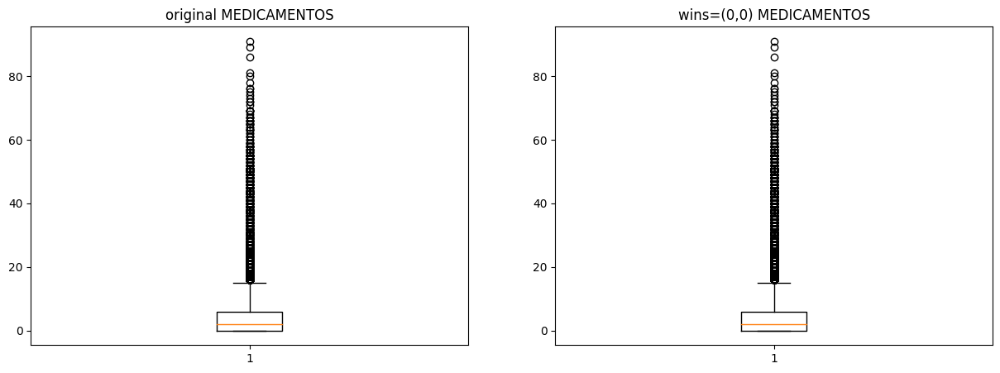

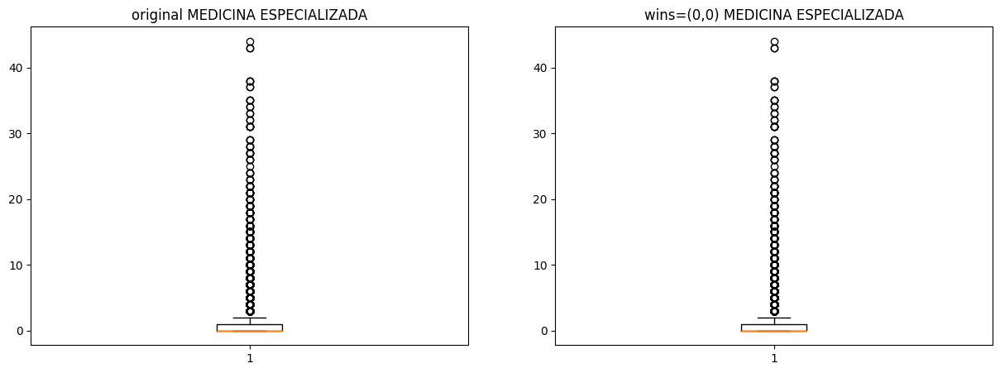

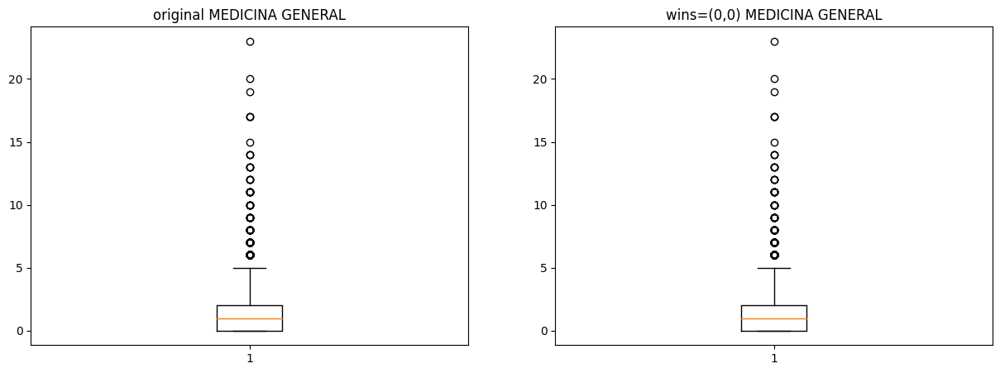

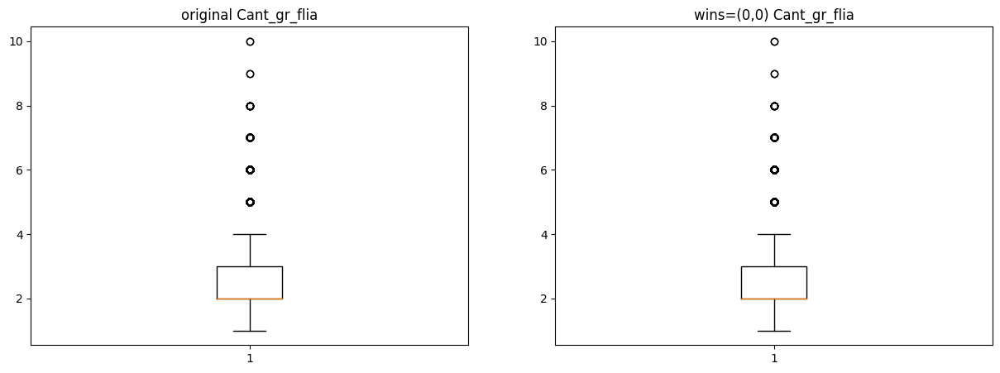

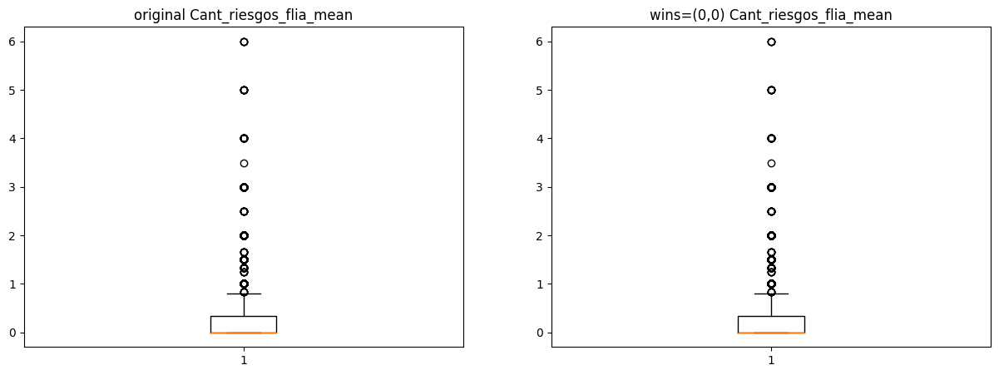

...

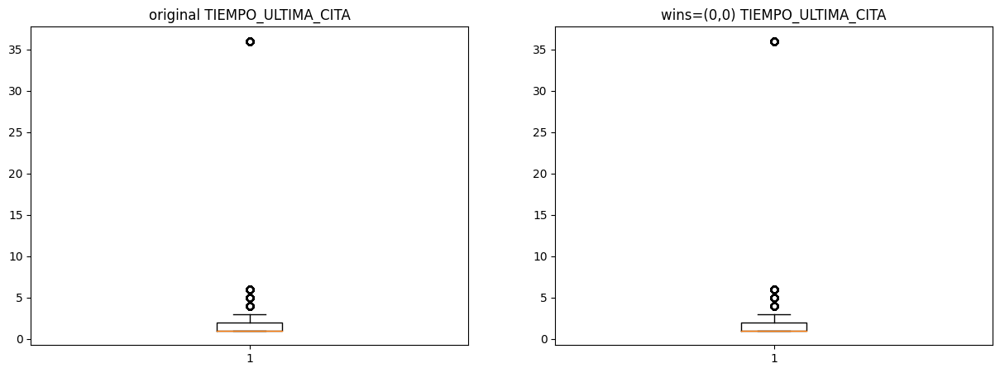

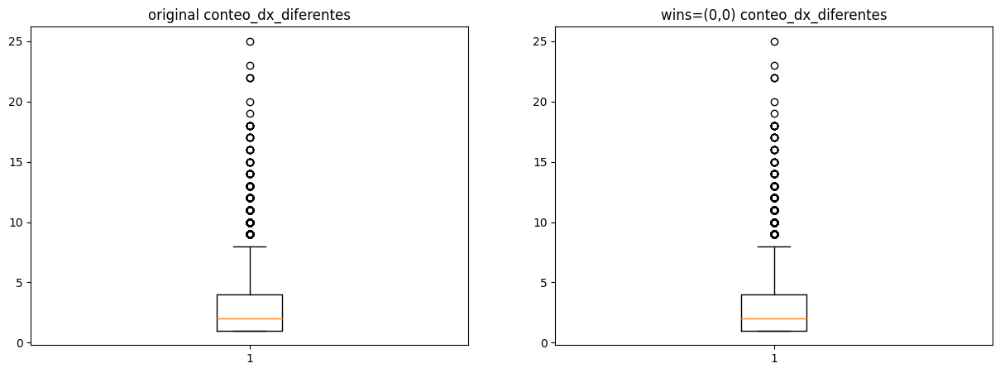

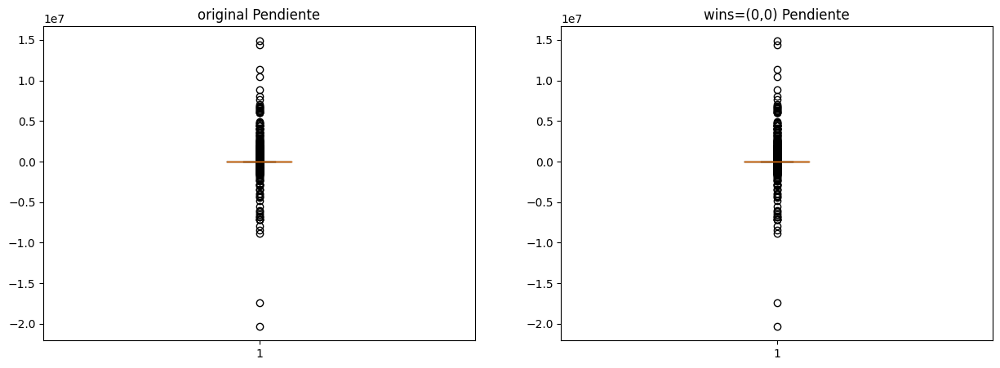

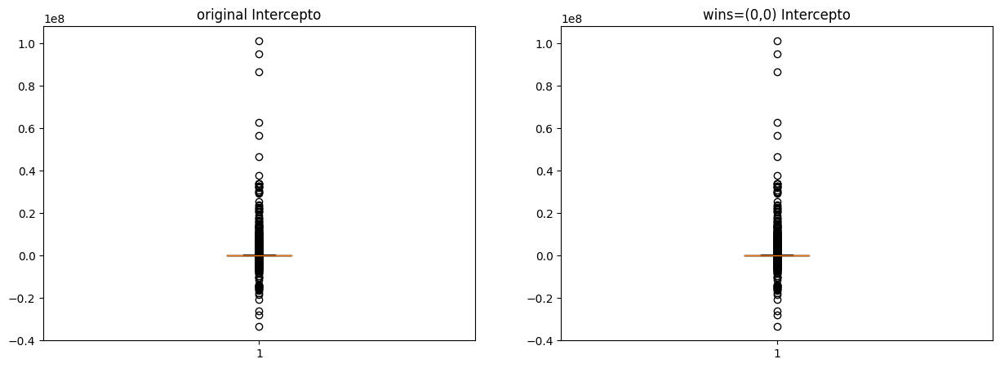

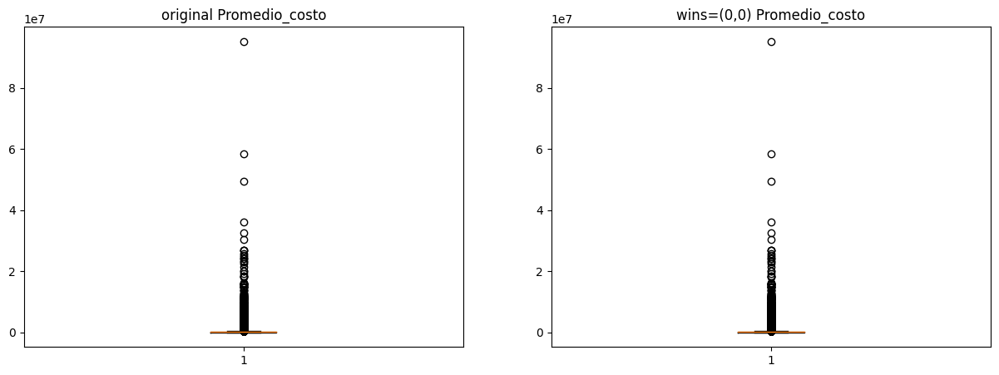

In [42]:
# Verificación de la winsorizing
wins_dict = {}
wins_dict = test_wins(cont_vars[0], df_train, wins_dict, upper_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[1], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[2], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[3], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[4], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[5], df_train, wins_dict, upper_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[6], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[7], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[8], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[9], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[10], df_train, wins_dict, upper_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[11], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[12], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[13], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[14], df_train, wins_dict, lower_limit=0, show_plot=True) #Sin ajustar
wins_dict = test_wins(cont_vars[15], df_train, wins_dict, upper_limit=0, show_plot=True) #Sin ajustar

Nota: Dejaremos propuesto para usarlo de momento no se modifica nada y se hará solo después para revisar que tanto mejora o no con winsorizing.

Implementamos una función que nos permite dibujar nuestros diagramas de cajas y bigotes haciendo especial énfasis en el sesgo de la distribución y los datos atípicos

In [43]:
def plot_numerical_features_boxplots(data, columns_list, rows, cols, title):
    sns.set_style('darkgrid')
    fig, axs = plt.subplots(rows, cols, figsize=(30, 14), sharey=True)
    fig.suptitle(title, fontsize=25, y=1)
    axs = axs.flatten()
    outliers_df = pd.DataFrame(columns=['Column', 'Outlier_index', 'Outlier_values'])
    for i, col in enumerate(columns_list):
        sns.boxplot(x=data[col], color='#404B69', ax=axs[i])
        axs[i].set_title(f'{col} (sesgo: {data[col].skew().round(2)})', fontsize=12)
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
        outliers_index = data[outliers].index.tolist()
        outliers_values = data[col][outliers].tolist()
        outliers_df = pd.concat([outliers_df,pd.DataFrame({'Column': col, 'Outlier_index': outliers_index, 'Outlier_values': outliers_values})], ignore_index=True)
        axs[i].plot([], [], 'ro', alpha=0.5, label=f'Atípicos: {outliers.sum()}')
        axs[i].legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    return outliers_df

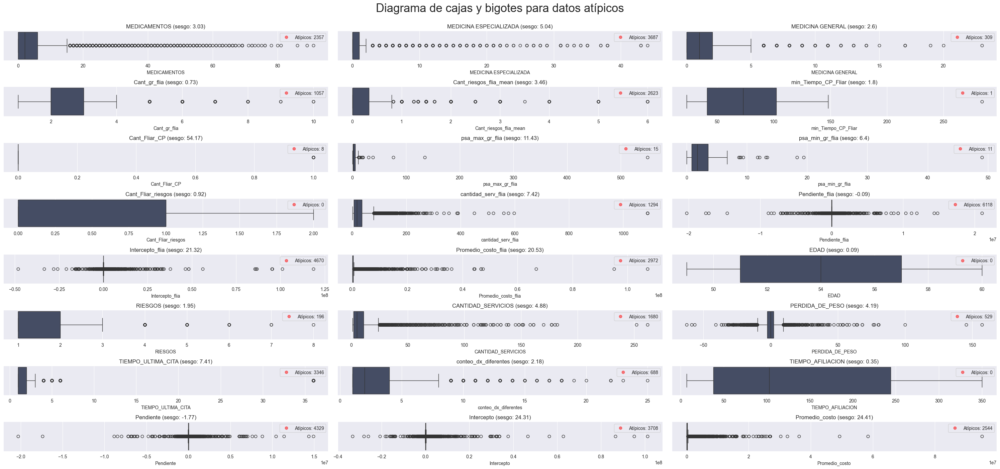

In [44]:
num_cols = pd.DataFrame (df_train, columns= df_train.select_dtypes(include=['int64','float64']).columns)
cat_cols = pd.DataFrame (df_train, columns= df_train.select_dtypes(include=['object', 'category']).columns)

outliers_df = plot_numerical_features_boxplots(data=df_train, columns_list=num_cols, rows=8, cols=3, title='Diagrama de cajas y bigotes para datos atípicos')

In [45]:
# Verificación de datos faltantes
missing_values = df_train.isnull().sum()
print('Valores faltantes en cada columna:')
print(missing_values)

Valores faltantes en cada columna:
MEDICAMENTOS                         0
MEDICINA ESPECIALIZADA               0
MEDICINA GENERAL                     0
Cant_gr_flia                         0
Cant_riesgos_flia_mean               0
min_Tiempo_CP_Fliar              23486
Cant_Fliar_CP                        0
psa_max_gr_flia                  23330
psa_min_gr_flia                  23330
Cant_Fliar_riesgos                   0
cantidad_serv_flia                   0
Pendiente_flia                       0
Intercepto_flia                      0
Promedio_costo_flia                  0
ESTADO_CIVI                          0
PROGRAMA                             0
estrato                              0
IMC                              10364
AGRUPACION_SISTOLICA              3320
AGRUPACION_DIASTOLICA             3320
parentesco                           0
EDAD                                 0
RIESGOS                          16283
CANTIDAD_SERVICIOS                   0
PERDIDA_DE_PESO              

In [46]:
# Calculamos el porcentaje de valores nulos por columna
percent_missing = df_train.isnull().mean() * 100
print(percent_missing)


MEDICAMENTOS                      0.000000
MEDICINA ESPECIALIZADA            0.000000
MEDICINA GENERAL                  0.000000
Cant_gr_flia                      0.000000
Cant_riesgos_flia_mean            0.000000
min_Tiempo_CP_Fliar              99.965949
Cant_Fliar_CP                     0.000000
psa_max_gr_flia                  99.301949
psa_min_gr_flia                  99.301949
Cant_Fliar_riesgos                0.000000
cantidad_serv_flia                0.000000
Pendiente_flia                    0.000000
Intercepto_flia                   0.000000
Promedio_costo_flia               0.000000
ESTADO_CIVI                       0.000000
PROGRAMA                          0.000000
estrato                           0.000000
IMC                              44.113391
AGRUPACION_SISTOLICA             14.131268
AGRUPACION_DIASTOLICA            14.131268
parentesco                        0.000000
EDAD                              0.000000
RIESGOS                          69.307057
CANTIDAD_SE

In [47]:
def plot_missing_values_heatmap(df, figsize=(20, 6), cmap="Blues"):
    """
    Genera un mapa de calor para visualizar la ubicación de los valores faltantes en un DataFrame.

    Parámetros:
    - df: DataFrame en el que se buscan los valores faltantes.
    - figsize: Tamaño de la figura del mapa de calor (por defecto (20, 6)).
    - cmap: El esquema de color para el mapa de calor (por defecto "Blues").
    
    Retorna:
    - Un gráfico de mapa de calor que muestra los valores faltantes.
    """
    
    plt.figure(figsize=figsize)
    sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap=cmap)
    plt.show()

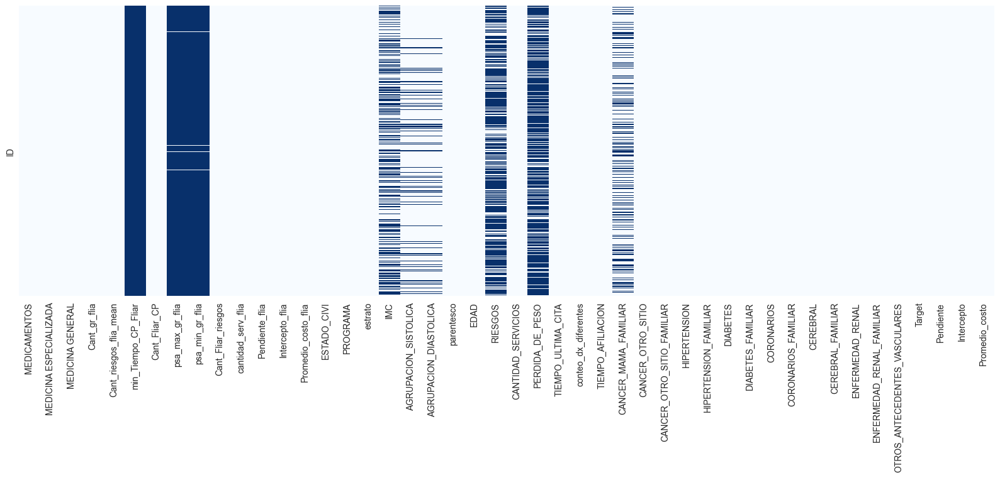

In [48]:
# Llamamos a la funcion con nuestro dataframe df_train
plot_missing_values_heatmap(df_train)

![alt text](Images/EDA-campesino.png)

**CONCLUSIONES SOBRE EDA**

- La variable objetivo 'Target', se encuentra algo desbalanceada teniendo una proporción del 71.5% Normal(0) y 28.5% Anormal (1)
- Matemática y gráficamente se observan comportamientos de outliers que se debatirán con especialistas del área médica
- Las proporciones de la variable objetivo se comportan o observan de forma similar si las contrastamos contra las variables categóricas, es decir aproximadamente hay valores Normales > 70% en cada categoría de cada variable, y valores < 29% Anormales en cada categoría de cada variable
- El análisis de correlaciones nos muestra unos resultados no muy claros por eso haremos uso de un algoritmo para mirar características que mejor describan la variable objetivo
- Matemáticamente se hayan una buena cantidad de outliers pero al tratarse de un área medica no podemos despreciarlos o acotarlos a la ligera
- Se encuentran algunas variables con una gran porcentaje de valores faltantes o nulos > 70%
- Se evidencian 2 variables que deben tener un trato personalizado para su imputación

Cada columna tiene 23494 regsitros y de las 46(45 independientes y 1 dependiente), tenemos 9 con datos faltantes o nulos.

- min_Tiempo_CP_Fliar              23486 faltantes >= 99%
- psa_max_gr_flia                  23330 faltantes >= 99%
- psa_min_gr_flia                  23330 faltantes >= 99%
- IMC                              10364 faltantes >= 44%
- AGRUPACION_SISTOLICA              3320 faltantes >= 14%
- AGRUPACION_DIASTOLICA             3320 faltantes >= 14%
- RIESGOS                          16283 faltantes >= 69%
- PERDIDA_DE_PESO                  17723 faltantes >= 75%
- CANCER_MAMA_FAMILIAR              6802 faltantes >= 28%

Teniendo este panorama decidimos buscar un poco de ayuda con profesionales de area médica para decidir que camino tomar en la imputación y eliminación de variables llegando a las siguientes conclusiones:

1. La variable **CANCER_MAMA_FAMILIAR** la imputadremos con una categoria que indique no ha sido medido o tomado. Esta desición se consultó con el host de la competencia después de ser analizada por el grupo de especialistas obteniedo acuerdo de él también, citamos su respuesta: "Tienes razón con la imputación de la variable cancer de mama familiar, no sería sano imputar con metodologias de ML, sin embargo, se puede agregar una categoria que indique que el valor no se evidencia". De acuerdo a como estaba formateada la variable esta nueva categoría es '2'.

2. La variable **RIESGOS** será imputada con un valor personalizado 0, debido a un argumento expresado por el host de la competencia: "Para el caso de los RIESGOS, los valores nulos corresponden a que aun no se les ha identifcado algun riesgo, por lo tanto, se pueden marcar con 0 (cero) riesgos".

3. La variable **IMC** será imputada con una nueva categoria para su valores faltantes, su valor es: 'No_medido'. Aquí un grupo de médico especialistas nos indicó que podría ser un grave error imputar por moda este campo ya que el IMC en la vida y experiencia real del trato de este tipo de cancer si da o brinda información importante a través de las cuales los especialistas pueden identificar de una mejor manera éste pronóstico. 

4. Las variables **min_Tiempo_CP_Fliar**, **psa_max_gr_flia** y **psa_min_gr_flia** serán eliminadas para la creación de los modelos pues presentan más del 99% de valores faltantes.

5. La variable **PERDIDA_DE_PESO** será eliminada para la creación de los modelos debido a que presenta más del 75% de valores faltantes

6. Las variables **AGRUPACION_SISTOLICA** y **AGRUPACION_DIASTOLICA** serán imputadas de forma tradicional sin buscar una forma especial debido a la significancia expresada por el grupo de especialistas sobre estas mismas, incluso más adelante se denotará si incluso podrían ser no tenidas en cuenta.

### **Preprocesamiento de datos**

- Analisis de importancia de variables
- Formateo de variables.
- Imputar valores faltantes.
- Manejo de outliers.
- Escalar las variables numéricas (normalización o estandarización).
- Codificar las variables categóricas mediante dummificación (One-Hot Encoding).
- Considerar técnicas como reducción de dimensionalidad (PCA) si es necesario.
- Crear un pipeline de preprocesamiento para que los datos estén listos para usarse en los modelos.

Abordaremos esto de una forma donde haremos un preprocesamiento previo a algunas variables que consideramos no alterará ni pondrá en riesgo nuestro dataframe para el conocido **data leakage**, por eso algunos pasos se verán reflejados en el entrenamiento.

- Análisis de importancia de variables

In [49]:
# Usamos un modelo de random forest para analizar importancia de variables
def plot_feature_importances(df, target_var, test_size=0.3, random_state=42):
    """
    Entrena un modelo de Random Forest y genera un gráfico de barras horizontal con la importancia de las variables.

    Parámetros:
    - df: DataFrame que contiene las características y la variable objetivo.
    - target_var: Nombre de la variable objetivo en el DataFrame.
    - test_size: Proporción del conjunto de datos para pruebas (predeterminado 0.3).
    - random_state: Semilla para la reproducibilidad del modelo (predeterminado 42).
    
    Retorna:
    - Un gráfico de barras horizontal que muestra la importancia de las características.
    """

    # Separar características y variable objetivo
    X = df.drop(target_var, axis=1)
    y = df[target_var]

    # Convertir variables categóricas a numéricas si es necesario
    X = pd.get_dummies(X, drop_first=True)

    # Entrenar el modelo Random Forest
    model = RandomForestClassifier(random_state=random_state)
    model.fit(X, y)

    # Obtener importancias
    importances = pd.Series(model.feature_importances_, index=X.columns)

    # Graficar la importancia de las variables
    importances.sort_values().plot(kind='barh', figsize=(8, 18))
    plt.title('Importancia de las Variables')
    plt.xlabel('Importancia')
    plt.ylabel('Características')
    plt.show()

    return importances

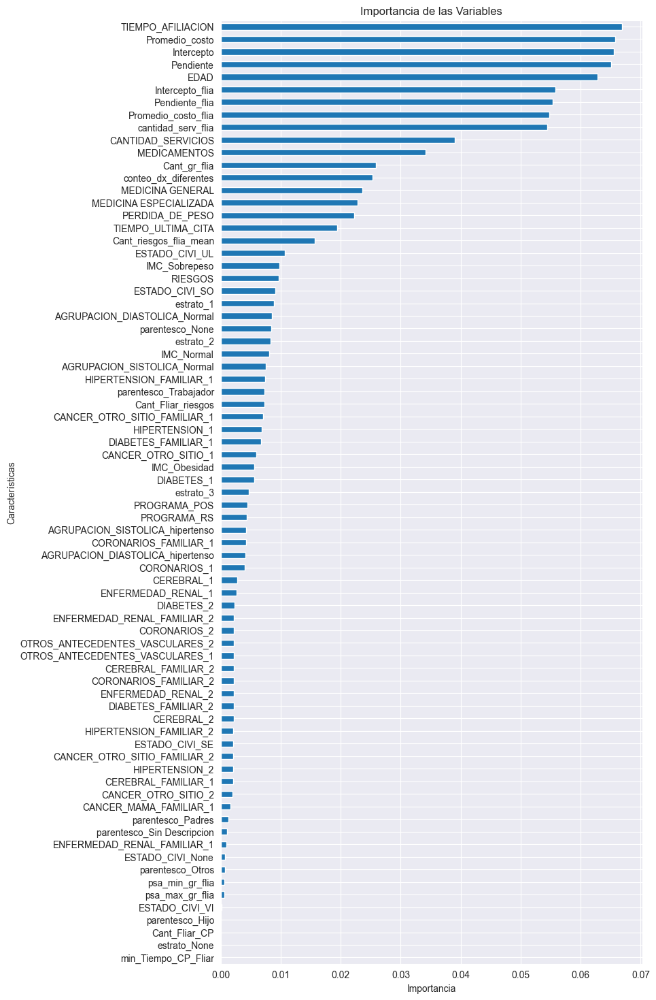

In [50]:
importances = plot_feature_importances(df_train, 'Target')

In [51]:
def plot_numerical_feature_importances(df, target_var, n_estimators=100, random_state=42, figsize=(8, 6)):
    """
    Entrena un modelo de Random Forest con variables numéricas y genera un gráfico de barras horizontal
    con la importancia de las mismas.

    Parámetros:
    - df: DataFrame que contiene las características numéricas y la variable objetivo.
    - target_var: Nombre de la variable objetivo en el DataFrame.
    - n_estimators: Número de árboles en el modelo Random Forest (predeterminado 100).
    - random_state: Semilla para la reproducibilidad del modelo (predeterminado 42).
    - figsize: Tamaño de la figura del gráfico (predeterminado (8, 6)).

    Retorna:
    - Un gráfico de barras horizontal que muestra la importancia de las variables numéricas.
    """
    
    # Seleccionar las variables numéricas
    numerical_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    X_num = df[numerical_vars]
    y = df[target_var]

    # Entrenar el modelo Random Forest
    rf = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state)
    rf.fit(X_num, y)

    # Obtener importancias de las variables
    importances = pd.Series(rf.feature_importances_, index=numerical_vars)

    # Graficar la importancia de las variables
    importances.sort_values().plot(kind='barh', figsize=figsize)
    plt.title('Importancia de Variables Numéricas')
    plt.xlabel('Importancia')
    plt.ylabel('Variables')
    plt.show()

    return importances


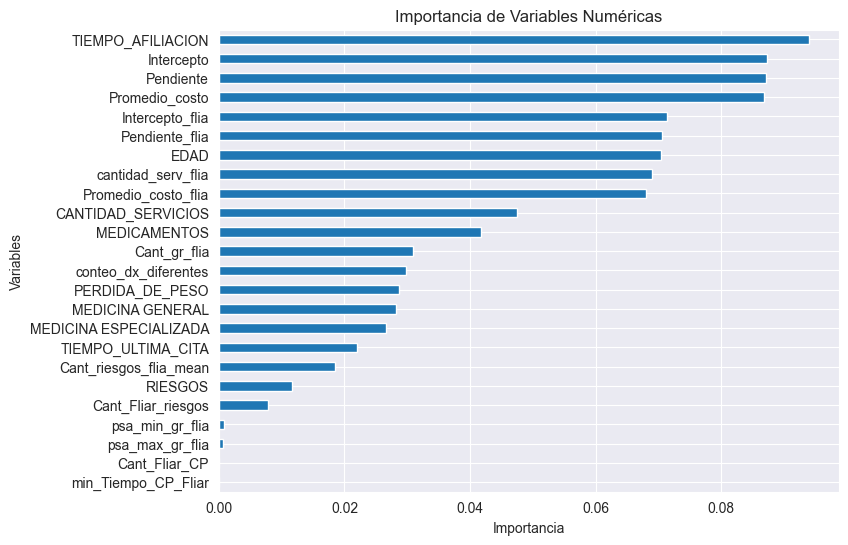

In [52]:
importances = plot_numerical_feature_importances(df_train, 'Target')

Realizamos pruebas de Chi-Cuadrado para evaluar la asociación entre cada variable categórica y 'Target'.

In [53]:
def chi2_test_categorical_vars(df, target_var, significance_level=0.05):
    """
    Realiza la prueba de Chi-cuadrado entre las variables categóricas y la variable objetivo.

    Parámetros:
    - df: DataFrame que contiene las variables categóricas y la variable objetivo.
    - target_var: Nombre de la variable objetivo.
    - significance_level: Nivel de significancia para determinar asociación significativa (por defecto 0.05).

    Retorna:
    - Un reporte de la prueba Chi-cuadrado para cada variable categórica.
    """
    
    # Seleccionar las variables categóricas
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()

    # Iterar sobre las variables categóricas
    for var in categorical_vars:
        # Crear la tabla de contingencia
        contingency_table = pd.crosstab(df[var], df[target_var])

        # Realizar la prueba de Chi-cuadrado
        chi2, p, dof, expected = chi2_contingency(contingency_table)

        # Mostrar los resultados
        print(f'Variable: {var}')
        print(f'Estadístico Chi2: {chi2:.2f}, Valor p: {p:.4f}')
        if p < significance_level:
            print('→ Asociación significativa con Target')
        else:
            print('→ No hay asociación significativa con Target')
        print('---')

In [54]:
chi2_test_categorical_vars(df_train, 'Target')

Variable: ESTADO_CIVI
Estadístico Chi2: 11.02, Valor p: 0.0510
→ No hay asociación significativa con Target
---
Variable: PROGRAMA
Estadístico Chi2: 1.35, Valor p: 0.5082
→ No hay asociación significativa con Target
---
Variable: estrato
Estadístico Chi2: 4.29, Valor p: 0.3676
→ No hay asociación significativa con Target
---
Variable: IMC
Estadístico Chi2: 26.01, Valor p: 0.0000
→ Asociación significativa con Target
---
Variable: AGRUPACION_SISTOLICA
Estadístico Chi2: 3.23, Valor p: 0.1992
→ No hay asociación significativa con Target
---
Variable: AGRUPACION_DIASTOLICA
Estadístico Chi2: 2.36, Valor p: 0.3074
→ No hay asociación significativa con Target
---
Variable: parentesco
Estadístico Chi2: 8.43, Valor p: 0.2084
→ No hay asociación significativa con Target
---
Variable: CANCER_MAMA_FAMILIAR
Estadístico Chi2: 4.95, Valor p: 0.0261
→ Asociación significativa con Target
---
Variable: CANCER_OTRO_SITIO
Estadístico Chi2: 3.09, Valor p: 0.2131
→ No hay asociación significativa con Target

Calculamos la información mutua para medir la dependencia entre las variables categóricas y 'Target'.

In [55]:
def plot_mutual_information_categorical(df, target_var, figsize=(8, 6)):
    """
    Calcula la información mutua entre las variables categóricas y la variable objetivo,
    y genera un gráfico de barras horizontal con los resultados.

    Parámetros:
    - df: DataFrame que contiene las variables categóricas y la variable objetivo.
    - target_var: Nombre de la variable objetivo en el DataFrame.
    - figsize: Tamaño de la figura del gráfico (por defecto (8, 6)).

    Retorna:
    - Un gráfico de barras horizontal que muestra la información mutua de las variables categóricas.
    """

    # Seleccionar variables categóricas
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()

    # Convertir variables categóricas a códigos numéricos
    X_cat = df[categorical_vars].apply(lambda x: x.astype('category').cat.codes)

    # Extraer la variable objetivo
    y = df[target_var]

    # Calcular la información mutua
    mi = mutual_info_classif(X_cat, y, discrete_features=True)

    # Crear una serie con los resultados de la información mutua
    mi_series = pd.Series(mi, index=categorical_vars)

    # Graficar los resultados
    mi_series.sort_values().plot(kind='barh', figsize=figsize)
    plt.title('Información Mutua de Variables Categóricas')
    plt.xlabel('Información Mutua')
    plt.ylabel('Variables')
    plt.show()

    return mi_series

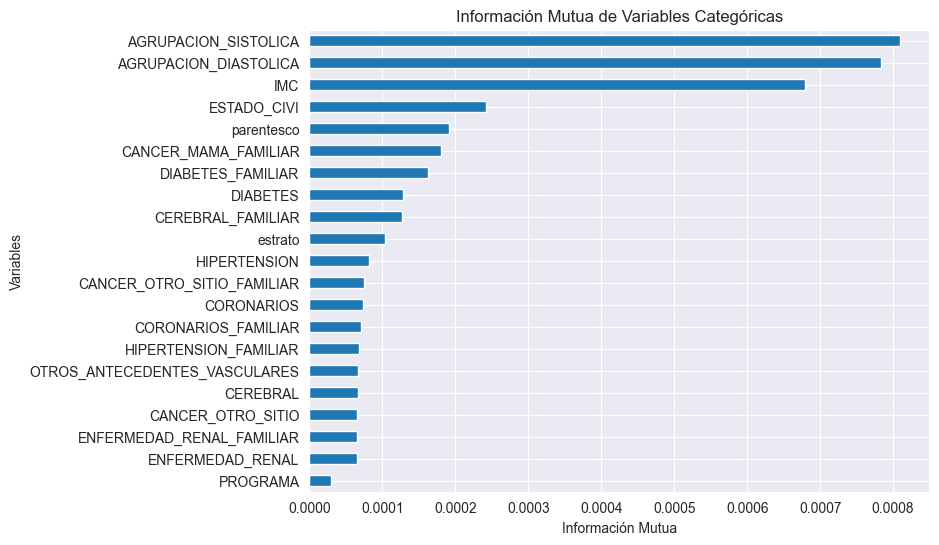

In [56]:
mi_series = plot_mutual_information_categorical(df_train, 'Target')

Estos análisis gráficos nos confirman nuestras anteriores conclusiones y las fortalecen. de momento continuaremos con nuestros planteamiento

- Formateo de variables.

In [57]:
# Para pruebas
df_train_transformed = df_train.copy()
df_train_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23494 entries, 16484 to 9409
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   MEDICAMENTOS                   23494 non-null  float64
 1   MEDICINA ESPECIALIZADA         23494 non-null  float64
 2   MEDICINA GENERAL               23494 non-null  float64
 3   Cant_gr_flia                   23494 non-null  int64  
 4   Cant_riesgos_flia_mean         23494 non-null  float64
 5   min_Tiempo_CP_Fliar            8 non-null      float64
 6   Cant_Fliar_CP                  23494 non-null  float64
 7   psa_max_gr_flia                164 non-null    float64
 8   psa_min_gr_flia                164 non-null    float64
 9   Cant_Fliar_riesgos             23494 non-null  float64
 10  cantidad_serv_flia             23494 non-null  float64
 11  Pendiente_flia                 23494 non-null  float64
 12  Intercepto_flia                23494 non-null  f

In [58]:
# Creamos un Transformer para renombrar y dar formato a las columnas
class Rename_columns(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()

        # Aplicamos el formato: eliminamos espacios, convertimos a minúsculas y reemplazamos por guiones bajos
        new_cols = []
        for col in result.columns:
            new_cols.append(re.sub(r'\s+', ' ', col.strip()).replace(' ', '_').lower())
        result.columns = new_cols
        
        # Renombramos columnas específicas si es necesario
        result = result.rename(columns={'estado_civi': 'estado_civil'})  #cambiamos el nombre a esta variable porque parece incompleto
        
        return result

In [59]:
# Prueba
df_train_transformed = Rename_columns().fit_transform(df_train)

In [60]:
# Prueba
df_train_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23494 entries, 16484 to 9409
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   medicamentos                   23494 non-null  float64
 1   medicina_especializada         23494 non-null  float64
 2   medicina_general               23494 non-null  float64
 3   cant_gr_flia                   23494 non-null  int64  
 4   cant_riesgos_flia_mean         23494 non-null  float64
 5   min_tiempo_cp_fliar            8 non-null      float64
 6   cant_fliar_cp                  23494 non-null  float64
 7   psa_max_gr_flia                164 non-null    float64
 8   psa_min_gr_flia                164 non-null    float64
 9   cant_fliar_riesgos             23494 non-null  float64
 10  cantidad_serv_flia             23494 non-null  float64
 11  pendiente_flia                 23494 non-null  float64
 12  intercepto_flia                23494 non-null  f

- Creamos un transformador personalizado que asigne valores específicos a las columnas que lo requieran, manteniendo el pipeline limpio y modular.

In [61]:
# Creamos un Transformer Trabajando con el índice de las variables para imputar unos valores específicos
class Custom_imputer(BaseEstimator, TransformerMixin):
    
    def __init__(self, custom_values=None):
        # Definir los valores específicos para las columnas que deseas imputar manualmente si no se pasa custom_values
        if custom_values is None:
            self.custom_values = {
                28: '2',  # CANCER_MAMA_FAMILIAR, agregamos una categoria 2 que indique que el valor no se evidencia.
                22: 0,    # RIESGOS, los valores nulos corresponden a que aun no se les ha identifcado algun riesgo, por lo tanto, se pueden marcar con 0 (cero) riesgos.
                17: 'No_medido'  # IMC, los valores nulos corresponden a que aun no se les ha identifcado IMC, creamos una nueva categoria para no imputar por moda
            }
        else:
            self.custom_values = custom_values  # Usar el diccionario proporcionado si se pasa uno

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for idx, value in self.custom_values.items():
            result.iloc[:, idx].fillna(value, inplace=True)  # Imputar valor específico usando el índice
        return result

In [62]:
# Prueba
df_train_transformed = Custom_imputer().fit_transform(df_train_transformed)

In [63]:
# Prueba
df_train_transformed[['cancer_mama_familiar', 'riesgos', 'imc']].isnull().sum()

cancer_mama_familiar    0
riesgos                 0
imc                     0
dtype: int64

In [64]:
# Prueba
df_train_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23494 entries, 16484 to 9409
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   medicamentos                   23494 non-null  float64
 1   medicina_especializada         23494 non-null  float64
 2   medicina_general               23494 non-null  float64
 3   cant_gr_flia                   23494 non-null  int64  
 4   cant_riesgos_flia_mean         23494 non-null  float64
 5   min_tiempo_cp_fliar            8 non-null      float64
 6   cant_fliar_cp                  23494 non-null  float64
 7   psa_max_gr_flia                164 non-null    float64
 8   psa_min_gr_flia                164 non-null    float64
 9   cant_fliar_riesgos             23494 non-null  float64
 10  cantidad_serv_flia             23494 non-null  float64
 11  pendiente_flia                 23494 non-null  float64
 12  intercepto_flia                23494 non-null  f

- Creamos un transformador personalizado para eliminar columnas en función del porcentaje de valores faltantes o errados (nulos) que tienen.

In [65]:
# Prueba Calculamos el porcentaje de valores nulos por columna
percent_missing = df_train_transformed.isnull().mean() * 100
print(percent_missing)

medicamentos                      0.000000
medicina_especializada            0.000000
medicina_general                  0.000000
cant_gr_flia                      0.000000
cant_riesgos_flia_mean            0.000000
min_tiempo_cp_fliar              99.965949
cant_fliar_cp                     0.000000
psa_max_gr_flia                  99.301949
psa_min_gr_flia                  99.301949
cant_fliar_riesgos                0.000000
cantidad_serv_flia                0.000000
pendiente_flia                    0.000000
intercepto_flia                   0.000000
promedio_costo_flia               0.000000
estado_civil                      0.000000
programa                          0.000000
estrato                           0.000000
imc                               0.000000
agrupacion_sistolica             14.131268
agrupacion_diastolica            14.131268
parentesco                        0.000000
edad                              0.000000
riesgos                           0.000000
cantidad_se

In [66]:
# Creamos un Transformer para eliminar variables que tengan más de 75% de datos nulos o faltantes
class Drop_columns_by_missing_Values(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.75):  # Umbral en porcentaje, 0.75 = 75%
        self.threshold = threshold
        self.columns_to_drop = []

    def fit(self, X, y=None):
        # Calcular el porcentaje de valores faltantes por columna
        percent_missing = X.isnull().mean()
        # Guardar las columnas que superan el umbral
        self.columns_to_drop = percent_missing[percent_missing > self.threshold].index
        return self

    def transform(self, X, y=None):
        # Eliminar las columnas que superan el umbral
        return X.drop(columns=self.columns_to_drop)

In [67]:
# Prueba
df_train_transformed = Drop_columns_by_missing_Values().fit_transform(df_train_transformed)

In [68]:
# Prueba Calculamos el porcentaje de valores nulos por columna
percent_missing = df_train_transformed.isnull().mean() * 100
print(percent_missing)

medicamentos                      0.000000
medicina_especializada            0.000000
medicina_general                  0.000000
cant_gr_flia                      0.000000
cant_riesgos_flia_mean            0.000000
cant_fliar_cp                     0.000000
cant_fliar_riesgos                0.000000
cantidad_serv_flia                0.000000
pendiente_flia                    0.000000
intercepto_flia                   0.000000
promedio_costo_flia               0.000000
estado_civil                      0.000000
programa                          0.000000
estrato                           0.000000
imc                               0.000000
agrupacion_sistolica             14.131268
agrupacion_diastolica            14.131268
parentesco                        0.000000
edad                              0.000000
riesgos                           0.000000
cantidad_servicios                0.000000
tiempo_ultima_cita                0.000000
conteo_dx_diferentes              0.000000
tiempo_afil

Hacemos uso de un pipeline para dejar listo nuestros dataframe que posteriormente utilizaremos para entrenar nuestros modelos

In [69]:
# Creamos un Pipeline donde reunimos nuestros transformer para hacer todo este primer preproceso en una sola línea
pipe_custom_pre = Pipeline(steps = [('rename columns', Rename_columns()),
                                    ('custom imputer', Custom_imputer()),
                                    ('drop columns > 75%', Drop_columns_by_missing_Values())])

In [70]:
# Prueba
df_train_pipeline_transformed = pipe_custom_pre.fit_transform(df_train)

In [71]:
# Prueba
df_train_pipeline_transformed

,medicamentos,medicina_especializada,medicina_general,cant_gr_flia,cant_riesgos_flia_mean,cant_fliar_cp,cant_fliar_riesgos,cantidad_serv_flia,pendiente_flia,intercepto_flia,...,coronarios_familiar,cerebral,cerebral_familiar,enfermedad_renal,enfermedad_renal_familiar,otros_antecedentes_vasculares,target,pendiente,intercepto,promedio_costo
ID,,,,,,,,,,,,,,,,,,,,,
16484,12.0,3.0,3.0,2,0.0,0.0,0.0,34.0,15998.485714,-23363.200000,...,0,0,0,0,0,0,0,58373.057143,-110021.200000,1.885690e+05
11528,6.0,1.0,1.0,2,0.5,0.0,1.0,25.0,655.200000,-1019.200000,...,0,0,0,0,0,0,0,19618.942857,-36176.133333,9.747050e+04
26630,1.0,0.0,2.0,2,0.0,0.0,0.0,36.0,342236.971429,-521835.400000,...,0,0,0,0,0,0,1,398534.000000,-626628.000000,2.304723e+06
12586,6.0,0.0,2.0,2,0.0,0.0,0.0,24.0,-4468.285714,30687.333333,...,0,0,0,0,0,0,0,1292.600000,13410.733333,5.380450e+04
11225,3.0,0.0,2.0,1,1.0,0.0,1.0,7.0,0.000000,0.000000,...,2,2,2,2,2,2,0,13728.714286,-27375.666667,4.134967e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7141,0.0,0.0,1.0,3,0.0,0.0,0.0,22.0,18670.800000,-32290.133333,...,0,0,0,0,0,0,0,6628.571429,-15466.666667,4.640000e+04
15417,6.0,0.0,3.0,1,1.0,0.0,1.0,11.0,462.857143,-1080.000000,...,2,2,2,2,2,2,0,36161.142857,-66307.333333,9.038500e+04
19389,8.0,2.0,2.0,1,0.0,0.0,0.0,15.0,5247.171429,-5493.266667,...,2,2,2,2,2,2,0,15912.885714,16190.066667,1.078278e+05


In [72]:
# Prueba
df_train_pipeline_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23494 entries, 16484 to 9409
Data columns (total 42 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   medicamentos                   23494 non-null  float64
 1   medicina_especializada         23494 non-null  float64
 2   medicina_general               23494 non-null  float64
 3   cant_gr_flia                   23494 non-null  int64  
 4   cant_riesgos_flia_mean         23494 non-null  float64
 5   cant_fliar_cp                  23494 non-null  float64
 6   cant_fliar_riesgos             23494 non-null  float64
 7   cantidad_serv_flia             23494 non-null  float64
 8   pendiente_flia                 23494 non-null  float64
 9   intercepto_flia                23494 non-null  float64
 10  promedio_costo_flia            23494 non-null  float64
 11  estado_civil                   23494 non-null  object 
 12  programa                       23494 non-null  o

___________________________________

Prueba con los kilos

# Separar variable objetivo y características
X = df_train_pipeline_transformed.drop('target', axis=1)
y = df_train_pipeline_transformed['target']

# Separar en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocesamiento
# Definir las columnas numéricas y categóricas
numeric_features = df_train_pipeline_transformed.select_dtypes(include=['int64', 'float64']).columns
categorical_features = df_train_pipeline_transformed.select_dtypes(include=['object', 'category']).columns

# Pipeline de preprocesamiento
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Mapeo de valores numéricos a nombres de kernel
kernel_map = {0: 'linear', 1: 'rbf', 2: 'poly'}

# Función para optimización bayesiana de SVC + PCA
def optimize_svc_pca(C, gamma, n_components, kernel_numeric):
    """Función objetivo para optimización bayesiana del SVC + PCA"""
    # Convertir el número del kernel a su correspondiente nombre
    kernel = kernel_map[int(round(kernel_numeric))]

    # Crear pipeline del modelo
    model_svc = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('pca', PCA(n_components=int(n_components))),  # Número de componentes como parámetro
        ('classifier', SVC(probability=True, kernel=kernel, C=C, gamma=gamma if kernel != 'linear' else 'scale'))])

    # Validación cruzada y cálculo del AUC
    auc = cross_val_score(model_svc, X_train, y_train, cv=5, scoring='roc_auc').mean()
    return auc

# Definir el espacio de búsqueda para C, gamma, n_components y kernel_numeric
param_bounds = {
    'C': (0.1, 10),
    'gamma': (0.0001, 1),  # gamma se optimiza para todos los kernels (lo manejamos dentro de la función)
    'n_components': (2, X_train.shape[1]),  # Número de componentes en PCA
    'kernel_numeric': (0, 2)  # Valor numérico para kernel: 0='linear', 1='rbf', 2='poly'
}

# Optimización bayesiana
optimizer = BayesianOptimization(
    f=lambda C, gamma, n_components, kernel_numeric: optimize_svc_pca(C, gamma, n_components, kernel_numeric),
    pbounds=param_bounds,
    random_state=42,
    verbose=2
)

optimizer.maximize(init_points=5, n_iter=10)

"""
Procesó por +550 min
    hizo 2 iteraciones:
        la primera +/- a los 7 minutos
        la segunda +/- a los 17 minutos
        Con el procesador overclokeado a max 5.2ghz en promedio 4.0 a 5.2 ghz

Procedemos a hacer más pruebas e ir de menos a más

"""

______________________________________________